<div style="text-align: center;">
    <h1 style="font-size: 20px;">
        Final project for the <strong style="font-size: 26px;">Information theory </strong> course<br>
        <strong style="font-size: 46px; display: block; margin-top: 20px;">Inferring change points in the spread of COVID-19</strong>
    </h1>
</div>

<hr style="border: 1px solid #000;">

<div style="display: flex; justify-content: center; align-items: center; flex-wrap: wrap; gap: 20px;">
    <img src="figures/unipd_template.png" alt="Unipd template" style="max-width: 350px; height: auto; margin: 0;">
    <img src="figures/pod_template_transparent.png" alt="PoD template" style="max-width: 450px; height: auto; margin: 0;">
</div>

<hr style="border: 1px solid #000;">

<div style="text-align: left; margin: 0 auto; width: 80%;">
    <p><strong style="font-size: 26px;">University of Padua - Department of Physics and Astronomy</strong></p>
    <p><strong>Degree course:</strong> Physics of Data</p>
    <p><strong>Course:</strong> Information Theory </p>
    <p><strong>Year:</strong> 2024-2025</p>
    <p><strong>Professor in charge:</strong> Michele Allegra </p>
    <table style="margin: 20px auto; border-collapse: collapse; width: 100%; font-size: 15px; text-align: left;">
        <thead>
            <tr>
                <th colspan="3" style="border: none; padding: 8px; text-align: center; font-weight: bold; font-size: 20px">Students</th>
            </tr>
            <tr>
                <th style="border: none; padding: 8px;">Name</th>
                <th style="border: none; padding: 8px;">ID</th>
                <th style="border: none; padding: 8px;">Email</th>
            </tr>
        </thead>
        <tbody>
            <tr>
                <td style="border: none; padding: 8px;">Ada D'Iorio</td>
                <td style="border: none; padding: 8px;">2092320</td>
                <td style="border: none; padding: 8px;">ada.diorio@studenti.unipd.it</td>
            </tr>
            <tr>
                <td style="border: none; padding: 8px;">Anna Garbo</td>
                <td style="border: none; padding: 8px;">2091751</td>
                <td style="border: none; padding: 8px;">anna.garbo.2@studenti.unipd.it</td>
            </tr>
        </tbody>
    </table>
</div>

# Basic SIR model (no switch and no delay) 

In this first section we are going to implement the basic SIR model structure, characterised by solving the system of differential equations:

$$
\begin{cases}
\frac{dS}{dt} = - \beta S I \\  
\frac{dI}{dt} = \beta S I - \gamma I \\  
\frac{dR}{dt} = \gamma I  
\end{cases}
$$

by integrating this system of equations it is possible to study the evolution of a pandemic.

In this basic model, the parameters that are going to be inferred are the *spreading rate* $\beta$, the recovery rate $\gamma$, the initial number of infected $I_0$ and the scale factor $\sigma$.

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import scipy.stats as stats
import pymc as pm
import pytensor 
import pytensor.tensor as pt
import pandas as pd 
import arviz as az 
import multiprocessing
from datetime import datetime, timedelta 
from SIR_functions import metropolis_hastings, metropolis_hastings_multi_chain

In [5]:
from SIR_functions import sir_discrete

# Parameters
N = 1e6 # population size 
t_max = 100
# Initial parameters for priors 
sigma_beta, mu_beta = 0.5, np.log(0.4) # initial value 0.5 for sigma
sigma_gamma, mu_gamma = 0.2, np.log(1/8) # \ \ 0.2 
sigma_I0 = 100
sigma_scale = 100 # 10 before 


## MCMC sampling

In order to solve the problem, we are going to use the **Markov Chain Monte Carlo** method. The aim is to build a chain that has as limiting distribution the posterior of all the parameters that have to be inferred in the model.
In the first part, we are going to construct from scratches the algorithm, defining the prior and likelihood distributions. For the seek of semplicity, we are going to define the **logprior** and **logposterior**. In this way, the final distribution will be obtained from the sum of all the parameters distributions indipendently.

In particular we have chosen to use the following distributions:

| Parameter         | Variable | Prior distribution                 |
|------------------|---------|-----------------------------------|
| Spreading rate  | \( $\lambda$ \) | LogNormal[log(0.4), 0.5]       |
| Recovery rate   | \( $\mu$ \)     | LogNormal[log(1/8), 0.2]       |
| Initially infected | \( $I_0$ \) | HalfCauchy(100)                |
| Scale factor    | \( $\sigma$ \)  | HalfCauchy(10)                 |

In order to stabilize the result, we are going to sample 20 MCMC chains and take as estimate for the result the mean of the inferred values from each chain. The standard deviation will be estimated too.

In [7]:
# Modello con le prior del paper 
def log_prior(beta, gamma, I0, scale):
    logp = (    
        stats.lognorm.logpdf(beta, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale)
    )
    return logp

In [8]:
def log_likelihood(params, data):
    beta, gamma, I0, scale = params
    I_pred = sir_discrete(beta, gamma, I0,scale, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=I_pred, scale=scale))


In [9]:
# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta, gamma, I0, scale = params
    prior = log_prior(beta, gamma, I0, scale)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

In [10]:
# ---- SIMULATE DATA ----
true_params = [0.4, 0.1, 100, 2]  # True values for beta, gamma, I0, scale
n_chains = 15
S0 = N - true_params[2]
y0 = [S0, true_params[2], 0]
t = np.linspace(0, 100, 100)
I_true = sir_discrete(*true_params, t_max, N) + np.random.normal(0, true_params[3], size=len(t))  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.7, 0.05, 80, 1] 

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 10, 0.2], 4)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 10, 0.05]) + np.random.uniform(-0.005, 0.005, 4)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, I_true, n_iter=20000, n_chains=n_chains)

Running chain 1/15...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:283: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/15...
Running chain 3/15...
Running chain 4/15...
Running chain 5/15...
Running chain 6/15...
Running chain 7/15...
Running chain 8/15...
Running chain 9/15...
Running chain 10/15...
Running chain 11/15...
Running chain 12/15...
Running chain 13/15...
Running chain 14/15...
Running chain 15/15...


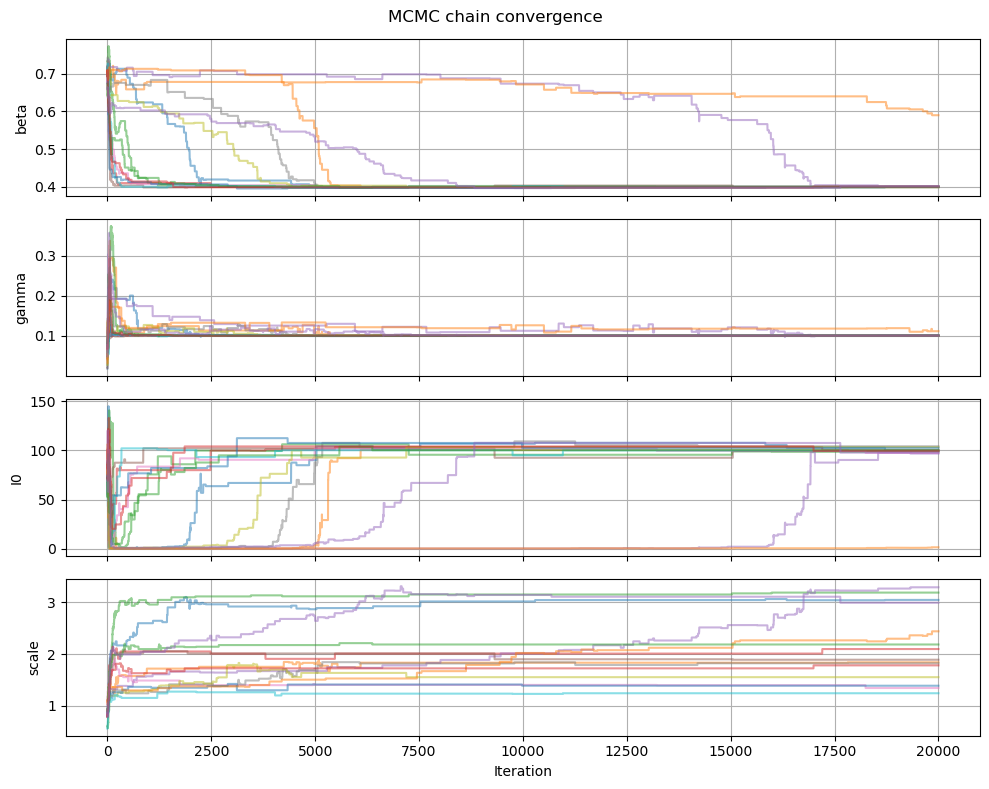

In [11]:
param_names = ["beta", "gamma", "I0", "scale"]

fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

True Parameters:
  Beta1: 0.4000, Gamma: 0.1000, I0: 100, Scale: 2
Infer Parameter:
  beta: 0.4135 ± 0.0504
  gamma: 0.1009 ± 0.0035
  I0: 93.4088 ± 24.7950
  scale: 2.1336 ± 0.6724


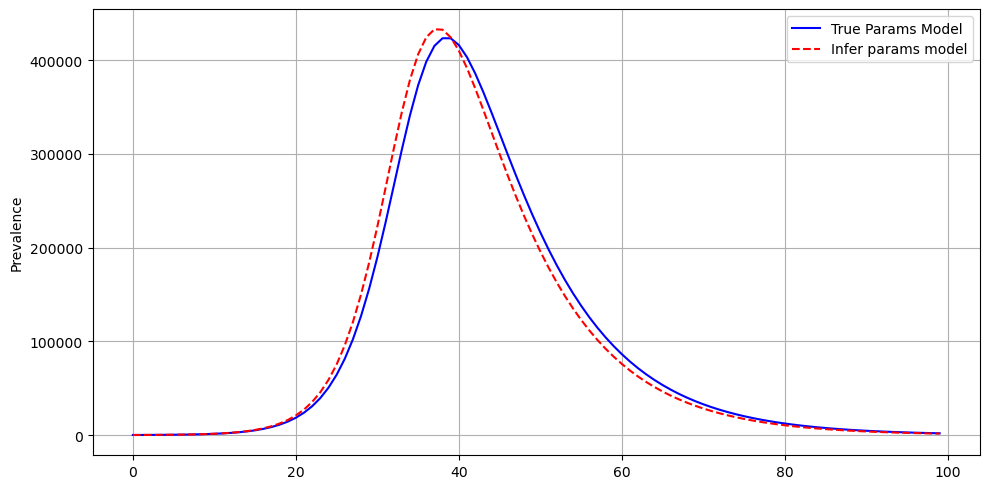

In [12]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta_sampled, gamma_sampled, I0_sampled, scale_sampled = mean_estimates

print("True Parameters:")
print(f"  Beta1: {true_params[0]:.4f}, Gamma: {true_params[1]:.4f}, I0: {true_params[2]}, Scale: {true_params[3]}")

print("Infer Parameter:")
for name, mean, std in zip(param_names, mean_estimates, std_estimates):
    print(f"  {name}: {mean:.4f} ± {std:.4f}")
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model = sir_discrete(*true_params, t_max, N)
I_sampled_model = sir_discrete(beta_sampled, gamma_sampled, I0_sampled, scale_sampled, t_max, N)

# ---- PLOT CONFRONTO ----
figure = plt.figure(figsize = (10, 5))
# Plot Infected Cases
plt.plot(I_true_model, label="True Params Model", color="blue")
plt.plot(I_sampled_model, label="Infer params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between true params model and infer params model")
plt.tight_layout()
plt.show()

As we can observe, the final values are compatible with the true values. Also, the inferred model is following the theoretical one in a significant way.

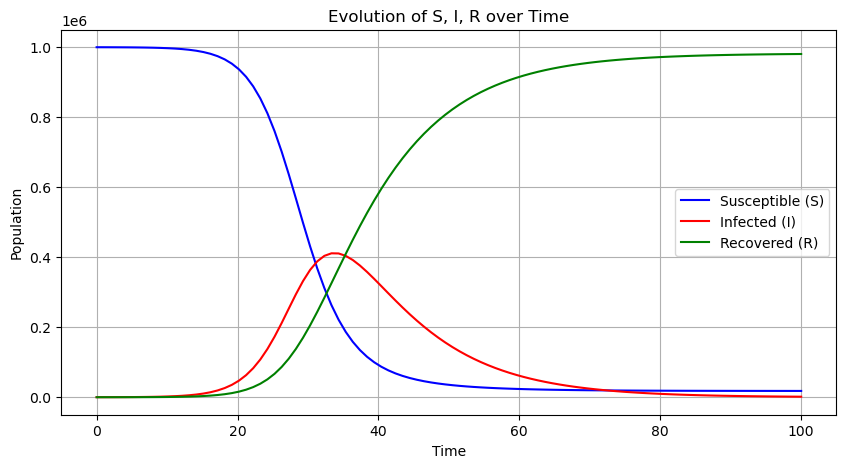

In [14]:
# Basic sir model, just for the plot 
def sir_model(y, t, beta, gamma):
    S, I, R = y
    # Change beta after day 50 - switching point
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return [dSdt, dIdt, dRdt]


# ---- SOLVE SIR MODEL USING ESTIMATED PARAMETERS ----
S0_est = N - I0_sampled
y0_est = [S0_est, I0_sampled, 0]  # Initial conditions

sol_est = odeint(sir_model, y0_est, t, args=(beta_sampled, gamma_sampled))
S_est, I_est, R_est = sol_est[:, 0], sol_est[:, 1], sol_est[:, 2]

# ---- PLOT THE EVOLUTION OF S, I, R ----
plt.figure(figsize=(10, 5))
plt.plot(t, S_est, label="Susceptible (S)", color="blue")
plt.plot(t, I_est, label="Infected (I)", color="red")
plt.plot(t, R_est, label="Recovered (R)", color="green")

plt.xlabel("Time")
plt.ylabel("Population")
plt.title("Evolution of S, I, R over Time")
plt.legend()
plt.grid()
plt.show()

## MCMC sampling using PYMC

In this subsection, we have solved the problem using the **PYMC** library. It is a Python library for Bayesian inference, using Markov Chain Monte Carlo sampling to estimate posterior probability distributions in complex statistical models.
PyMC uses **No-U-Turn-Sampler (NUTS)** to generate samples from the posterior distribution. This allows estimating parameters and their uncertainties based on the data.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [beta, gamma, I0, scale]


Output()

Sampling 10 chains for 1_000 tune and 4_000 draw iterations (10_000 + 40_000 draws total) took 62 seconds.


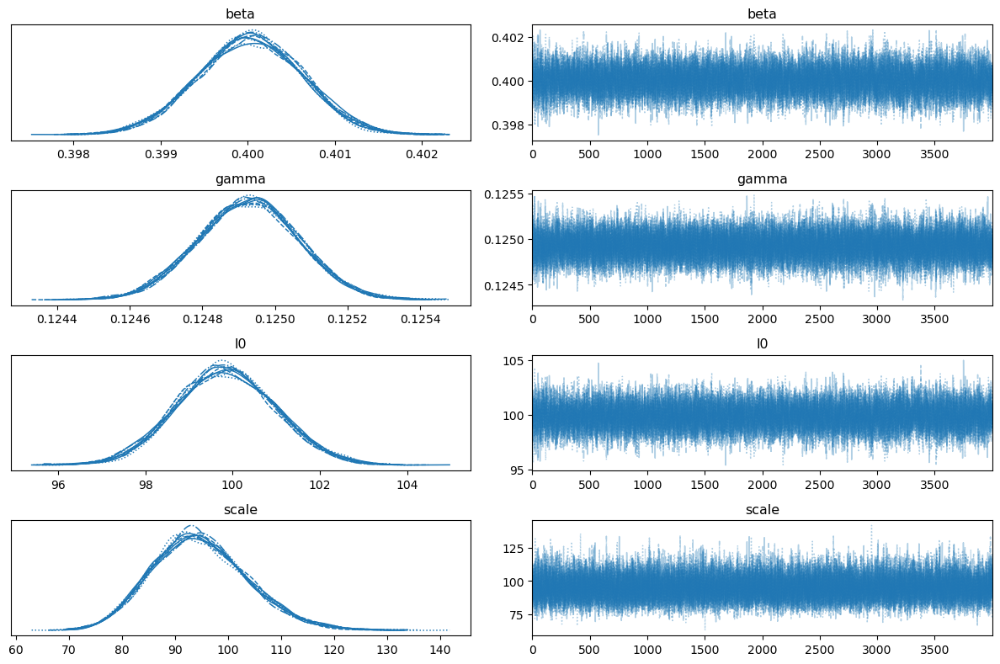

In [16]:
def sir_model_pytensor(beta, gamma, N, I0, t):
    
    def step(_, S, I, R, beta, gamma, N):
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        S_new = S + dSdt
        I_new = I + dIdt
        R_new = R + dRdt
        return S_new, I_new, R_new

    S0 = pt.cast(N - I0, "float64")  
    R0 = pt.cast(0, "float64")  
    I0 = pt.cast(I0, "float64")  

    outputs, _ = pytensor.scan(fn=step, sequences=t, outputs_info=[S0, I0, R0], non_sequences=[beta, gamma, N])
    
    return outputs[1]  

# ---- SIMULATE DATA ----
true_params = [0.4, 1/8, 100, 100]  
N = 1e5
t = np.linspace(0, 100, 100)  

# ---- TEST CON PARAMETRI VERI ----
beta_true, gamma_true, I0_true, scale_true = true_params
t_t = pt.as_tensor_variable(t)

# Convertiamo in PyTensor
beta_t = pt.as_tensor_variable(beta_true)
gamma_t = pt.as_tensor_variable(gamma_true)
I0_t = pt.as_tensor_variable(I0_true)

# Eseguiamo il modello una sola volta con i parametri veri
I_test = sir_model_pytensor(beta_t, gamma_t, N, I0_t, t_t)

# Compiliamo ed eseguiamo il calcolo con PyTensor
f = pytensor.function([], I_test)
I_true = f()
df_t = 4  
I_obs = I_true + stats.t.rvs(df=df_t, loc=0, scale=true_params[3], size=len(t))

# ---- BAYESIAN MODEL ----
with pm.Model() as model:
    # Priors
    beta = pm.Lognormal("beta", mu=np.log(0.4), sigma=0.5)
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=200)
    scale = pm.HalfCauchy("scale", beta=10)

    # Convertiamo le variabili in tensori `PyTensor`
    beta_t = pt.as_tensor_variable(beta)
    gamma_t = pt.as_tensor_variable(gamma)
    I0_t = pt.as_tensor_variable(I0)
    t_t = pt.as_tensor_variable(t)

    # SIR model in PyTensor
    I_pred =  sir_model_pytensor(beta_t, gamma_t, N, I0_t, t_t)

    # Likelihood (data model)
    pm.StudentT("obs", nu=4, mu=I_pred, sigma=scale, observed=I_obs)

    # Sampling
    trace = pm.sample(4000, tune=1000, cores=10, return_inferencedata=True, target_accept=0.9)

# ---- PLOT RESULTS ----
pm.plot_trace(trace)
plt.tight_layout()
plt.show()


In [17]:
# Genera il summary
summary = az.summary(trace)

summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta,0.400,0.001,0.399,0.401,0.000,0.000,10785.0,16024.0,1.0
gamma,0.125,0.000,0.125,0.125,0.000,0.000,13929.0,18728.0,1.0
I0,99.853,1.147,97.752,102.060,0.011,0.008,11138.0,16087.0,1.0
scale,94.766,9.041,78.247,111.764,0.060,0.043,22375.0,21600.0,1.0


As in the previous case, the inferred values are compatible with the theoretical one.

# SIR model with delay introduction (no switches)

The same model structure is employed also in this case. The main difference is the introduction of the **delay** parameter, that is actually representing the reporting delay between the new infections and the newly reported cases. The parameters that are going to be used are:

| Parameter         | Variable | Prior distribution                 |
|------------------|---------|-----------------------------------|
| Spreading rate  | \( $\lambda$ \) | LogNormal[log(0.4), 0.5]       |
| Recovery rate   | \( $\mu$ \)     | LogNormal[log(1/8), 0.2]       |
| Reporting delay | \( D \)       | LogNormal[log(8), 0.2]         |
| Initially infected | \( $I_0$ \) | HalfCauchy(100)                |
| Scale factor    | \( $\sigma$ \)  | HalfCauchy(10)                 |


In [21]:
from SIR_functions import sir_discrete_delay_no_switch

# ---- PARAMETERS ----
N = 1e6  # Population size
t_max = 100  # Total days of simulation
# Priors
N = 1e6
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_delay, mu_delay = 0.2, np.log(8)
sigma_I0 = 100
sigma_scale = 10

# ---- PRIOR FUNCTION ----
def log_prior(beta, gamma, delay, I0, scale):
    logp = (
        stats.lognorm.logpdf(beta, s=0.5, scale=np.exp(np.log(0.4))) +
        stats.lognorm.logpdf(gamma, s=0.2, scale=np.exp(np.log(1/8))) +
        stats.lognorm.logpdf(delay, s=0.2, scale=np.exp(np.log(8))) +
        stats.halfcauchy.logpdf(I0, scale=100) +
        stats.halfcauchy.logpdf(scale, scale=10)
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta, gamma, delay, I0, scale = params
    I_pred, C_pred = sir_discrete_delay_no_switch(beta, gamma, delay, I0, scale, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=C_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta, gamma, delay, I0, scale = params
    prior = log_prior(beta, gamma, delay, I0, scale)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

n_chains = 15 
# ---- SIMULATE DATA ----
true_params = [0.4, 1/8, 8, 100, 2]  # True values for beta, gamma, delay, I0, scale
I_true, C_true = sir_discrete_delay_no_switch(*true_params, t_max, N)  # Generate true epidemic curve
C_true += np.random.normal(0, true_params[4], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.8, 0.05, 5, 100, 1.5]  # Initial parameter guess

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 2, 2, 0.2], 5)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 2, 1, 0.05]) + np.random.uniform(-0.005, 0.005, 5)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, C_true, n_iter=20000, n_chains=n_chains)


Running chain 1/15...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:283: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/15...
Running chain 3/15...
Running chain 4/15...
Running chain 5/15...
Running chain 6/15...
Running chain 7/15...
Running chain 8/15...
Running chain 9/15...
Running chain 10/15...
Running chain 11/15...
Running chain 12/15...
Running chain 13/15...
Running chain 14/15...
Running chain 15/15...


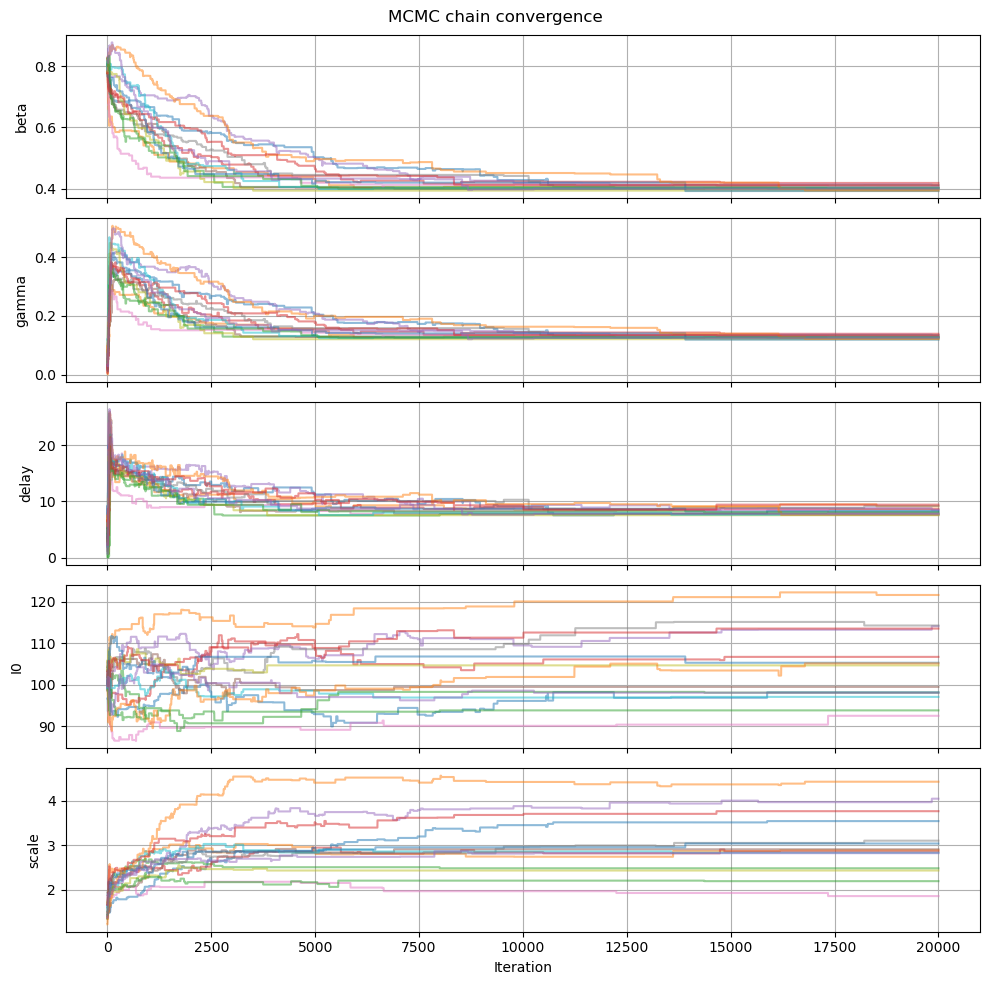

In [22]:
# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta", "gamma", "delay", "I0", "scale"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

True Params:
  Beta1: 0.4000, Gamma: 0.1250, delay: 8, I0: 100, Scale: 2
Inferred Params:
  beta: 0.4044 ± 0.0073
  gamma: 0.1281 ± 0.0054
  delay: 8.2641 ± 0.6048
  I0: 104.1172 ± 8.2279
  scale: 3.0064 ± 0.6589


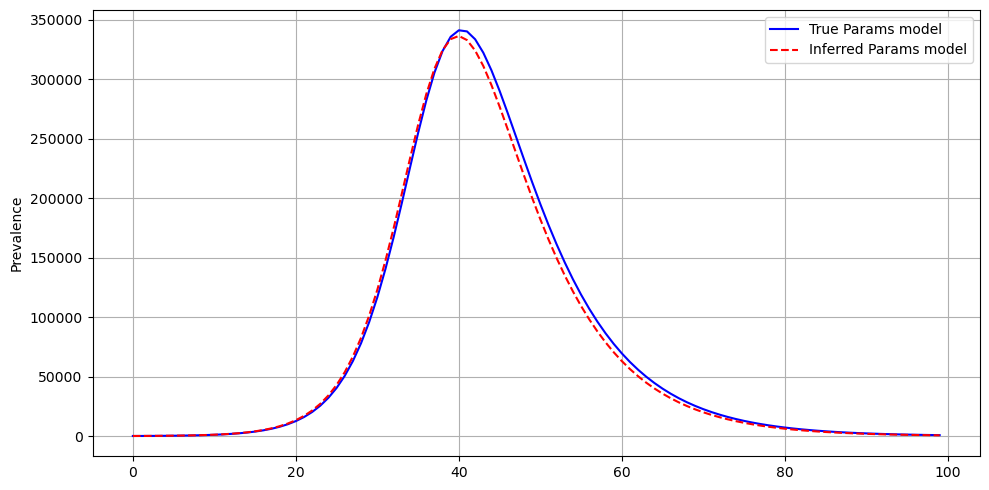

In [23]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled = mean_estimates

print("True Params:")
print(f"  Beta1: {true_params[0]:.4f}, Gamma: {true_params[1]:.4f}, delay: {true_params[2]}, I0: {true_params[3]}, Scale: {true_params[4]}")

print("Inferred Params:")
for name, mean, std in zip(param_names, mean_estimates, std_estimates):
    print(f"  {name}: {mean:.4f} ± {std:.4f}")
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model, C_true_model = sir_discrete_delay_no_switch(*true_params, t_max, N)
I_sampled_model, C_sampled_model = sir_discrete_delay_no_switch(beta_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_max, N)

# ---- PLOT CONFRONTO ----
figure = plt.figure(figsize = (10, 5))
# Plot Infected Cases
plt.plot(I_true_model, label="True Params model", color="blue")
plt.plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between True Params model and Inferred Params model")
plt.tight_layout()
plt.show()

The delay is actually introducing some noise in the model, making the prediction for the algorithm harder.

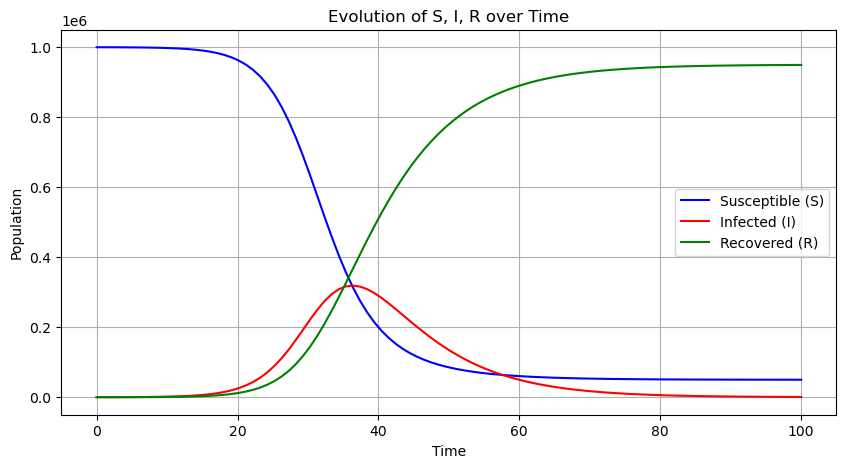

In [25]:
# Basic sir model, just for the plot 
def sir_model(y, t, beta, gamma, delay, N):
    S, I, R = y
    
    # Introduce delay in transmission using a past infection value
    delayed_t = max(0, t - delay)
    delayed_I = I if delayed_t == 0 else I  # Placeholder, ODE solvers don't natively support history
    
    # Compute new infections and recoveries
    dSdt = -beta * S * delayed_I / N
    dIdt = beta * S * delayed_I / N - gamma * I
    dRdt = gamma * I
    
    return [dSdt, dIdt, dRdt]


# ---- SOLVE SIR MODEL USING ESTIMATED PARAMETERS ----
S0_est = N - I0_sampled
y0_est = [S0_est, I0_sampled, 0]  # Initial conditions

sol_est = odeint(sir_model, y0_est, t, args=(beta_sampled, gamma_sampled, delay_sampled, N))
S_est, I_est, R_est = sol_est[:, 0], sol_est[:, 1], sol_est[:, 2]

# ---- PLOT THE EVOLUTION OF S, I, R ----
plt.figure(figsize=(10, 5))
plt.plot(t, S_est, label="Susceptible (S)", color="blue")
plt.plot(t, I_est, label="Infected (I)", color="red")
plt.plot(t, R_est, label="Recovered (R)", color="green")

plt.xlabel("Time")
plt.ylabel("Population")
plt.title("Evolution of S, I, R over Time")
plt.legend()
plt.grid()
plt.show()


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, gamma, I0, delay, scale_delay, scale]


Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 517 seconds.


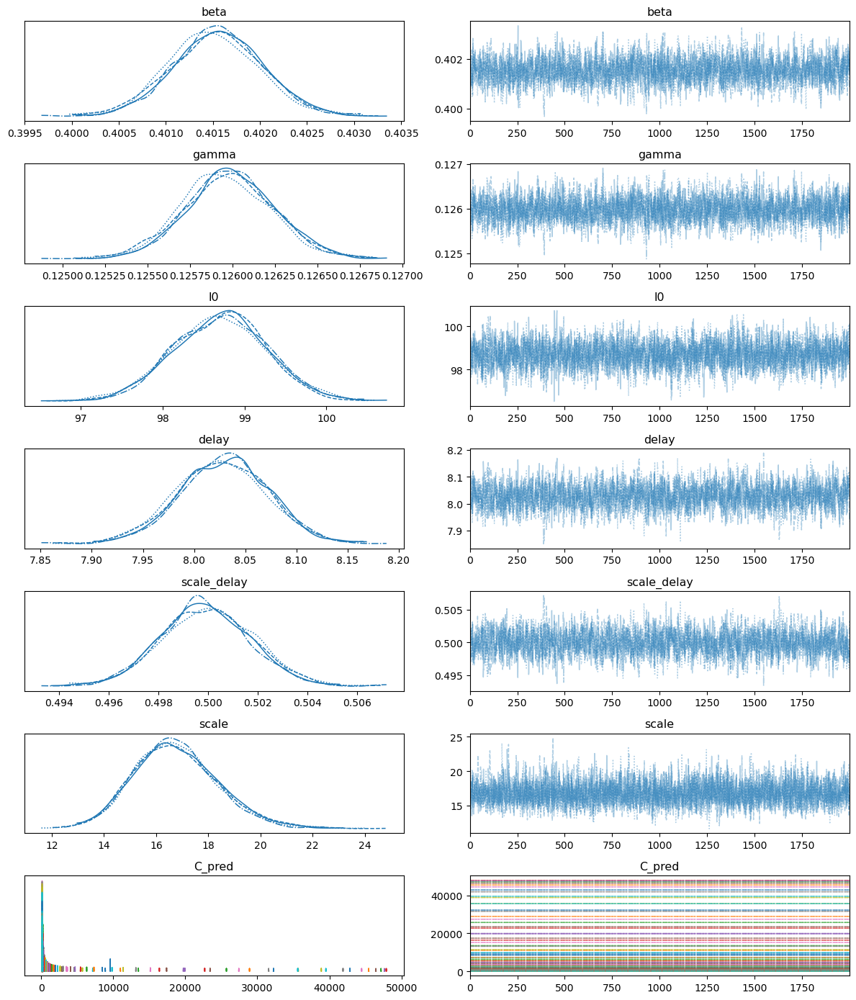

In [26]:
from SIR_functions import pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal 

# ---- SIR MODEL ----
def sir_model_pytensor(beta, gamma, N, I0, t_max):

    def step(_, S, I, R, I_new, beta, gamma, N):
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        S_new = S + dSdt
        I_new = I + dIdt
        R_new = R + dRdt
        return S_new, I_new, R_new, -dSdt

    S0 = pt.cast(N - I0, "float64")
    R0 = pt.cast(0, "float64")
    I0 = pt.cast(I0, "float64")
    I_new0 = pt.cast(0, "float64")

    outputs, _ = pytensor.scan(fn=step, sequences=pt.arange(t_max),
                               outputs_info=[S0, I0, R0, I_new0],
                               non_sequences=[beta, gamma, N])

    return outputs[3]  # nuovi infetti giornalieri


# ---- SIMULAZIONE DATI ----
true_params = {"beta": 0.4, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100

# SIR deterministico
I_new_true = sir_model_pytensor(true_params["beta"], true_params["gamma"], N, true_params["I0"], t_max)
f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Ritardo osservativo lognormale
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=5, loc=0, scale=true_params["scale"], size=len(C_obs))

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta = pm.Lognormal("beta", mu=np.log(0.4), sigma=0.5)
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    scale_delay = pm.HalfNormal("scale_delay", sigma=1)

    I_new_pred = sir_model_pytensor(beta, gamma, N, I0, t_max)
    C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(I_new_pred, t_max, t_max, delay, scale_delay))

    scale = pm.HalfCauchy("scale", beta=10)
    pm.StudentT("obs", nu=5, mu=C_pred, sigma=scale, observed=C_obs)

    trace = pm.sample(2000, tune=500, cores=4, target_accept=0.9)

az.plot_trace(trace)
plt.tight_layout()
plt.show()




In [27]:
summary = az.summary(trace)
summary
#print(summary.tail(6))

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta,0.402,0.000,0.401,0.402,0.000,0.000,2214.0,2671.0,1.0
gamma,0.126,0.000,0.125,0.126,0.000,0.000,2338.0,2791.0,1.0
I0,98.702,0.575,97.622,99.787,0.011,0.008,2595.0,3255.0,1.0
delay,8.028,0.044,7.945,8.110,0.001,0.001,2018.0,2773.0,1.0
scale_delay,0.500,0.002,0.497,0.503,0.000,0.000,2050.0,2616.0,1.0
...,...,...,...,...,...,...,...,...,...
C_pred[95],80.681,0.463,79.816,81.551,0.010,0.007,2056.0,2704.0,1.0
C_pred[96],71.577,0.424,70.788,72.379,0.009,0.007,2056.0,2704.0,1.0
C_pred[97],63.520,0.388,62.799,64.258,0.009,0.006,2057.0,2733.0,1.0
C_pred[98],56.386,0.356,55.732,57.068,0.008,0.006,2059.0,2704.0,1.0


# SIR model with one switch

We are going to assume now that the spreading rate $\beta$ may change at ceratin time points $t_i$ from $\beta_{i-1}$ to $\beta_b$ linearly over a time window of $\Delta t_i$ days. In this way, we are taking into account for mitigation measures applied to contrast the spreading of the pandemic, such as the closing of markets and public spaces.

The new model will be characterized by:

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change point      | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
| Recovery rate     | \( $\gamma$ \)  | LogNormal(log(1/8), 0.2)     |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |

In this first case, the reporting delay will be omitted.


In [176]:
# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta_before, beta_after, gamma, I0, scale = params
    prior = log_prior(beta_before, beta_after, gamma, I0, scale)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:283: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


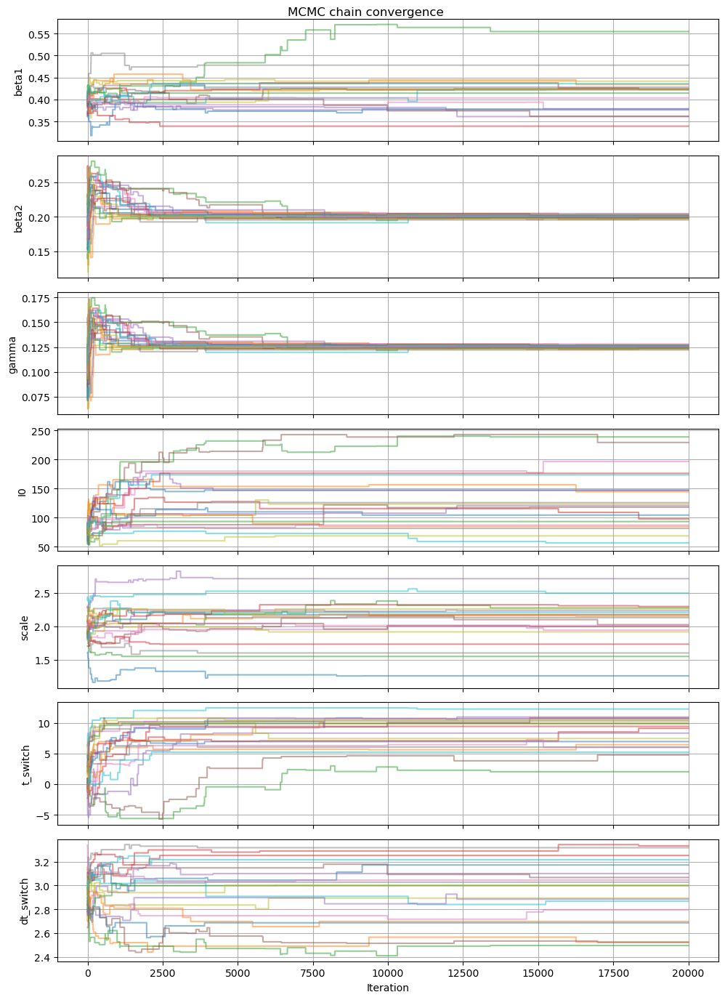

In [230]:
from SIR_functions import sir_discrete_single_switch 

# Parameters
N = 1e6 # population size 
t = np.linspace(0, 50, 50) # time grid 
t_max = 100
beta_before, beta_after = 0.4, 0.2

# Initial parameters for priors 
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_gamma, mu_gamma = 0.2, np.log(1/8) # \ \ 0.2 
sigma_I0 = 100
sigma_scale = 10
sigma_t, mu_t =  3,14
sigma_dt, mu_dt = 0.3, np.log(3)

# Modello con le prior del paper 
def log_prior(beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch):
    logp = (    
        stats.lognorm.logpdf(beta_before, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(beta_after, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale) +
        stats.norm.logpdf(t_switch, loc=mu_t, scale=sigma_t) +
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch = params
    I_pred = sir_discrete_single_switch(beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=I_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch = params
    prior = log_prior(beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

# ---- MCMC (Metropolis-Hastings) ----
def metropolis_hastings(log_posterior, initial_params, data, n_iter=5000, step_sizes=None):
    params = np.array(initial_params)
    samples = [params]
    if step_sizes is None:
        step_sizes = np.array([0.01, 0.05, 0.05, 10, 0.05, 0.5, 0.05])  # Larger step for delay and I0
    
    for _ in range(n_iter):
        proposal = params + np.random.normal(0, step_sizes, size=len(params))
        
        logp_old = log_posterior(params, data)
        logp_new = log_posterior(proposal, data)
        
        accept_ratio = np.exp(logp_new - logp_old)
        if np.random.rand() < accept_ratio:
            params = proposal  # Accept proposal
        
        samples.append(params)
    
    return np.array(samples)

n_chains = 20
# ---- SIMULATE DATA ----
true_params = [0.4, 0.2, 1/8, 100, 2, 10, 3]  # True values for beta1, beta2, gamma, I0, scale, switch point, dt
I_true = sir_discrete_single_switch(*true_params, t_max, N)  # Generate true epidemic curve
I_true += np.random.normal(0, true_params[-2], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.4, 0.2, 0.1, 80, 2, 1, 3]  # Initial parameter guess

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 0.02, 2, 0.2, 2, 0.2], 7)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 0.02, 10, 0.05, 1, 0.05]) + np.random.uniform(-0.005, 0.005, 7)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, I_true, n_iter=20000, n_chains=n_chains)

# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta1", "beta2", "gamma", "I0", "scale", "t_switch", "dt_switch"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

   Parameter  True Value  Inferred Mean    Std Dev
0      beta1       0.400       0.416352   0.045337
1      beta2       0.200       0.200275   0.002480
2      gamma       0.125       0.125212   0.001592
3         I0     100.000     130.532295  49.828770
4      scale       2.000       2.056622   0.323665
5   t_switch      10.000       8.395973   2.592849
6  dt_switch       3.000       2.944813   0.253618


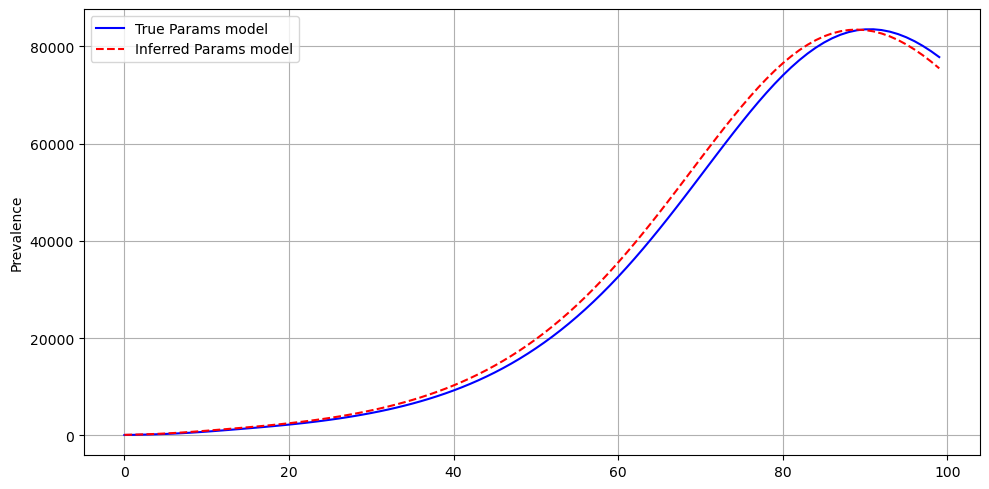

In [231]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, gamma_sampled, I0_sampled, scale_sampled, t_switch_sampled, dt_switched_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model = sir_discrete_single_switch(*true_params, t_max, N)
I_sampled_model = sir_discrete_single_switch(*mean_estimates, t_max, N)

# ---- PLOT CONFRONTO ----
figure = plt.figure(figsize = (10, 5))
# Plot Infected Cases
plt.plot(I_true_model, label="True Params model", color="blue")
plt.plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between True Params Model and Inferred params model")
plt.tight_layout()
plt.show()

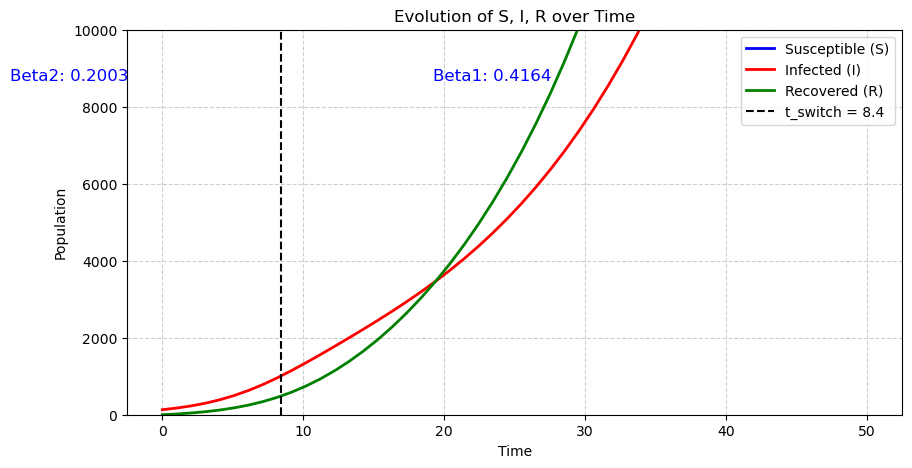

In [264]:
# Basic sir model, just for the plot 
def sir_model(y, t, beta_before, beta_after, gamma, t_switch, dt_switch):
    S, I, R = y
    # Change beta after day 50 - switching point
    transition = 1 / (1 + np.exp(-(t - t_switch) / dt_switch))
    beta = beta_before * (1 - transition) + beta_after * transition  # Interpolazione pesata
        
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return [dSdt, dIdt, dRdt]


# ---- SOLVE SIR MODEL USING ESTIMATED PARAMETERS ----
S0_est = N - I0_sampled
y0_est = [S0_est, I0_sampled, 0]  # Initial conditions

sol_est = odeint(sir_model, y0_est, t, args=(beta1_sampled, beta2_sampled, gamma_sampled, t_switch_sampled, dt_switched_sampled))
S_est, I_est, R_est = sol_est[:, 0], sol_est[:, 1], sol_est[:, 2]

# ---- PLOT THE EVOLUTION OF S, I, R ----

plt.figure(figsize=(10, 5))

# Traccia le curve per S, I, R
plt.plot(t, S_est, label="Susceptible (S)", color="blue", linewidth=2)
plt.plot(t, I_est, label="Infected (I)", color="red", linewidth=2)
plt.plot(t, R_est, label="Recovered (R)", color="green", linewidth=2)

# Linea verticale per t_switch
plt.axvline(x=t_switch_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch_sampled:.1f}")

y_text_position = 0.9 * 1e4  # o qualunque valore ben dentro ylim

plt.text(t_switch_sampled + 15, y_text_position, f'Beta1: {beta1_sampled:.4f}', 
         fontsize=12, verticalalignment='top', horizontalalignment='center', color='blue')

plt.text(t_switch_sampled-15, y_text_position, f'Beta2: {beta2_sampled:.4f}', 
         fontsize=12, verticalalignment='top', horizontalalignment='center', color='blue')


# Miglioramenti estetici
plt.xlabel("Time")
plt.ylabel("Population")
plt.title("Evolution of S, I, R over Time")
plt.legend()
plt.ylim(0,1e4)
#plt.xlim(0,10)
plt.grid(True, linestyle="--", alpha=0.6)

# Mostra il grafico
plt.show()

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, transient_begin_0, transient_len_0, gamma, I0, scale]


Output()

Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 1480 seconds.


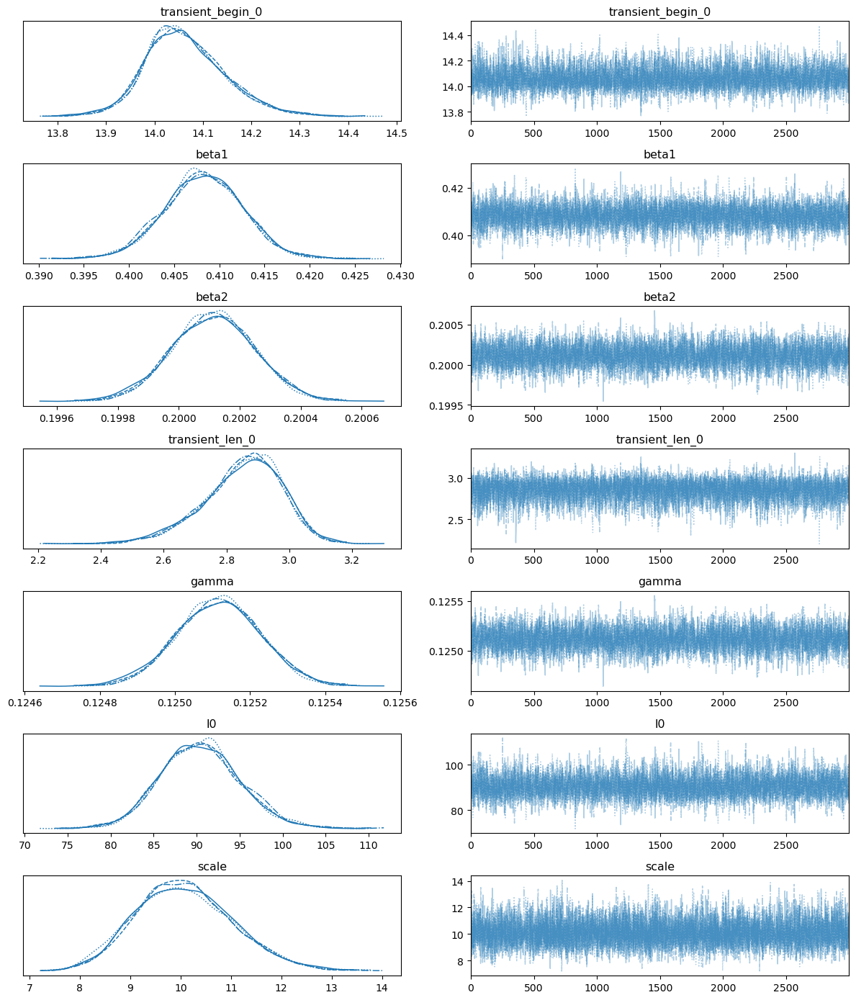

In [221]:
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model

true_params = {"beta1": 0.4, "beta2": 0.2, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 50, 50)
lambda_list = [0.4, 0.2]
num_days_sim = 100
tr_begin_list = [14] #[datetime(2020, 3, 9) + timedelta(days=7)]
tr_len_list = [3]

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
I_obs = I_new_true + stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(I_new_true))

date_begin_simulation = datetime(2020, 3, 2)
#change_points_list = [7] # changing point at day 7 

change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=7),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.4,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    }
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)

    lambda_list = [beta1, beta2]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days   # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    #delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    #scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )

    num_days_data = new_I.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=new_I[:num_days_data],
                 sigma= scale, 
                 observed=I_obs)

    trace = pm.sample(3000, tune=1000, cores=4, chains=4, target_accept=0.85)



az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [223]:
summary=pm.summary(trace)
summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,14.064,0.083,13.920,14.234,0.001,0.001,4921.0,5545.0,1.0
beta1,0.408,0.004,0.400,0.416,0.000,0.000,5141.0,5758.0,1.0
beta2,0.200,0.000,0.200,0.200,0.000,0.000,5023.0,6007.0,1.0
transient_len_0,2.851,0.125,2.608,3.071,0.002,0.001,5423.0,5201.0,1.0
gamma,0.125,0.000,0.125,0.125,0.000,0.000,4983.0,5995.0,1.0
I0,90.469,4.705,81.663,99.064,0.065,0.046,5228.0,5996.0,1.0
scale,10.086,0.974,8.279,11.901,0.011,0.007,8629.0,6701.0,1.0


# SIR model with 1 switch and delay introduction

In this extended version of the SIR model with 1 switch, we are going to take into account also for a reporting delay.

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change point      | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
| Recovery rate     | \( $\gamma$ \)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |

Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:283: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


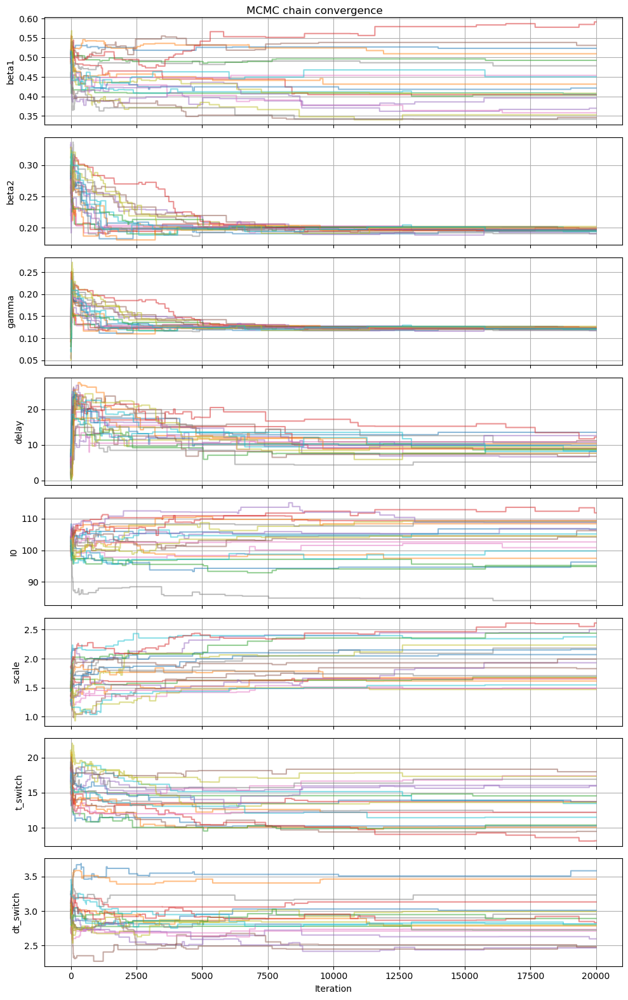

In [312]:
from SIR_functions import sir_discrete_delay_w_switch 

# ---- PARAMETERS ----
N = 1e6  # Population size
t_max = 100  # Total days of simulation
# Priors
N = 1e6
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_delay, mu_delay = 0.2, np.log(8)
sigma_I0 = 100
sigma_scale = 10
sigma_time, mu_time = 0.3, np.log(7)
sigma_dt, mu_dt = 0.3, np.log(3)

# ---- PRIOR FUNCTION ----
def log_prior(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch):
    logp = (
        stats.lognorm.logpdf(beta_before, s=0.5, scale=np.exp(np.log(0.4))) +
        stats.lognorm.logpdf(beta_after, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(gamma, s=0.2, scale=np.exp(np.log(1/8))) +
        stats.lognorm.logpdf(delay, s=0.2, scale=np.exp(np.log(8))) +
        stats.halfcauchy.logpdf(I0, scale=100) +
        stats.halfcauchy.logpdf(scale, scale=10) +
        stats.norm.logpdf(t_switch, loc=mu_time, scale=sigma_time) +
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch = params
    I_pred, C_pred = sir_discrete_delay_w_switch(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=C_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch = params
    prior = log_prior(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

n_chains = 20
# ---- SIMULATE DATA ----
true_params = [0.4, 0.2, 1/8, 8, 100, 2, 14, 3]  # True values for beta, gamma, delay, I0, scale
I_true, C_true = sir_discrete_delay_w_switch(*true_params, t_max, N)  # Generate true epidemic curve
C_true += np.random.normal(0, true_params[4], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.5, 0.3, 0.1, 5, 103, 1.5, 17, 3]  # Initial parameter guess

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 0.02, 2, 2, 0.2, 2, 0.2], 8)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.01, 0.02, 2, 1, 0.05, 0.5, 0.05]) + np.random.uniform(-0.005, 0.005, 8)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, C_true, n_iter=20000, n_chains=n_chains)

# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta1", "beta2", "gamma", "delay", "I0", "scale", "t_switch","dt_switch"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()


   Parameter  True Value  Inferred Mean   Std Dev
0      beta1       0.400       0.433050  0.066880
1      beta2       0.200       0.196982  0.002738
2      gamma       0.125       0.122652  0.002280
3      delay       8.000       9.315122  2.058024
4         I0     100.000     103.084893  6.679718
5      scale       2.000       1.927979  0.353298
6   t_switch      14.000      13.353991  2.811694
7  dt_switch       3.000       2.878011  0.292366


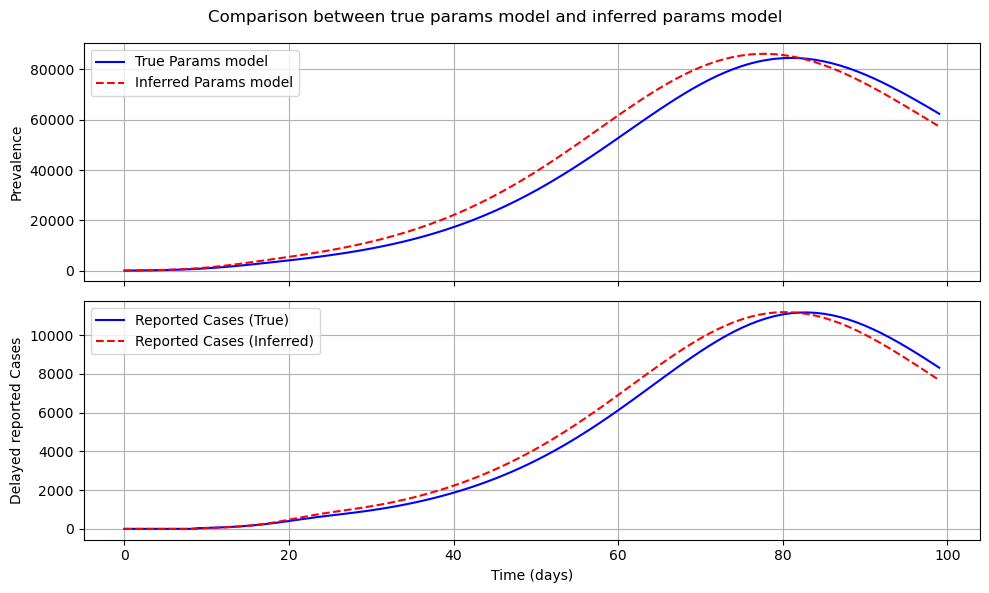

In [314]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_switch_sampled, dt_switch_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model, C_true_model = sir_discrete_delay_w_switch(*true_params, t_max, N)
I_sampled_model, C_sampled_model = sir_discrete_delay_w_switch(beta1_sampled, beta2_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_switch_sampled, dt_switch_sampled, t_max, N)

# ---- PLOT CONFRONTO ----
fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

# Plot Infected Cases
ax[0].plot(I_true_model, label="True Params model", color="blue")
ax[0].plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
ax[0].set_ylabel("Prevalence")
ax[0].legend()
ax[0].grid()

# Plot Reported Cases (con delay)
ax[1].plot(C_true_model, label="Reported Cases (True)", color="blue")
ax[1].plot(C_sampled_model, label="Reported Cases (Inferred)", color="red", linestyle="dashed")
ax[1].set_ylabel("Delayed reported Cases")
ax[1].set_xlabel("Time (days)")
ax[1].legend()
ax[1].grid()

fig.suptitle("Comparison between true params model and inferred params model")
plt.tight_layout()
plt.show()

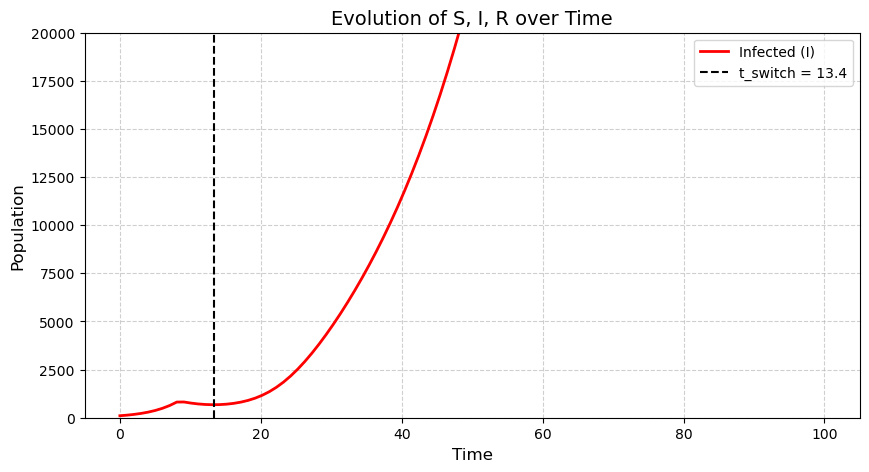

In [326]:
def sir_model(y, t, beta_before, beta_after, gamma, delay, t_switch, dt_switch, N, I_sampled_model):
    S, I, R = y  # Non include più I_past, lo otteniamo direttamente da I_sampled_model
    
    # Calcolare il valore di beta in base al tempo
    transition = 1 / (1 + np.exp(-(t - t_switch) / dt_switch))
    beta = beta_before * (1 - transition) + beta_after * transition  # Interpolazione pesata per beta
    
    # Introduciamo il ritardo: accediamo all'array delle infezioni passate (delay)
    # In caso di ritardo, I_past corrisponde a I[t - delay] se t - delay è valido
    if int(t - delay) >= 0:  # Assicurati che t - delay sia un indice valido
        I_past = I_sampled_model[int(t - delay)]  # Infezioni avvenute 'delay' giorni fa
    else:
        I_past = I_sampled_model[int(t)]  # Se t - delay è negativo, considera che non ci sono infezioni passate
    
    # Calcolare le derivate
    dSdt = -beta * S * I_past / N  # Nuove infezioni dipendono dalle infezioni ritardate
    dIdt = beta * S * I_past / N - gamma * I  # Infezioni e recupero
    dRdt = gamma * I  # Recuperi
    
    return [dSdt, dIdt, dRdt]  # Non è più necessario restituire I_past_array

# ---- RISOLVI IL MODELLO SIR CON I PARAMETRI STIMATI ----
S0_est = N - I0_sampled
y0_est = [S0_est, I0_sampled, 0]  # Condizioni iniziali

# Risolvere il modello SIR usando i parametri stimati
sol_est = odeint(sir_model, y0_est, t, args=(beta1_sampled, beta2_sampled, gamma_sampled, delay_sampled, t_switch_sampled, dt_switched_sampled, N, I_sampled_model))
S_est, I_est, R_est = sol_est[:, 0], sol_est[:, 1], sol_est[:, 2]

# ---- PLOT THE EVOLUTION OF S, I, R ----

plt.figure(figsize=(10, 5))

# Traccia le curve per S, I, R
#plt.plot(t, S_est, label="Susceptible (S)", color="blue", linewidth=2)
plt.plot(t, I_est, label="Infected (I)", color="red", linewidth=2)
#plt.plot(t, R_est, label="Recovered (R)", color="green", linewidth=2)

# Linea verticale per t_switch
plt.axvline(x=t_switch_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch_sampled:.1f}")

y_text_position = 0.9 * 250

# Aggiungi i valori di beta1 prima del t_switch
#plt.text(t_switch_sampled - 15, y_text_position , f'Beta1: {beta1_sampled:.4f}', 
         #fontsize=12, verticalalignment='top', horizontalalignment='center', color='red')

# Aggiungi i valori di beta2 dopo il t_switch
#plt.text(t_switch_sampled + 15,y_text_position , f'Beta2: {beta2_sampled:.4f}', 
         #fontsize=12, verticalalignment='top', horizontalalignment='center', color='red')

# Miglioramenti estetici
plt.xlabel("Time", fontsize=12)
plt.ylabel("Population", fontsize=12)
plt.title("Evolution of S, I, R over Time", fontsize=14)
plt.legend(fontsize=10)
#plt.xlim(-1,20)
plt.ylim(0,20000)
plt.grid(True, linestyle="--", alpha=0.6)

# Mostra il grafico
plt.show()

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, transient_begin_0, transient_len_0, gamma, I0, delay, scale_delay, scale]


Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 1239 seconds.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


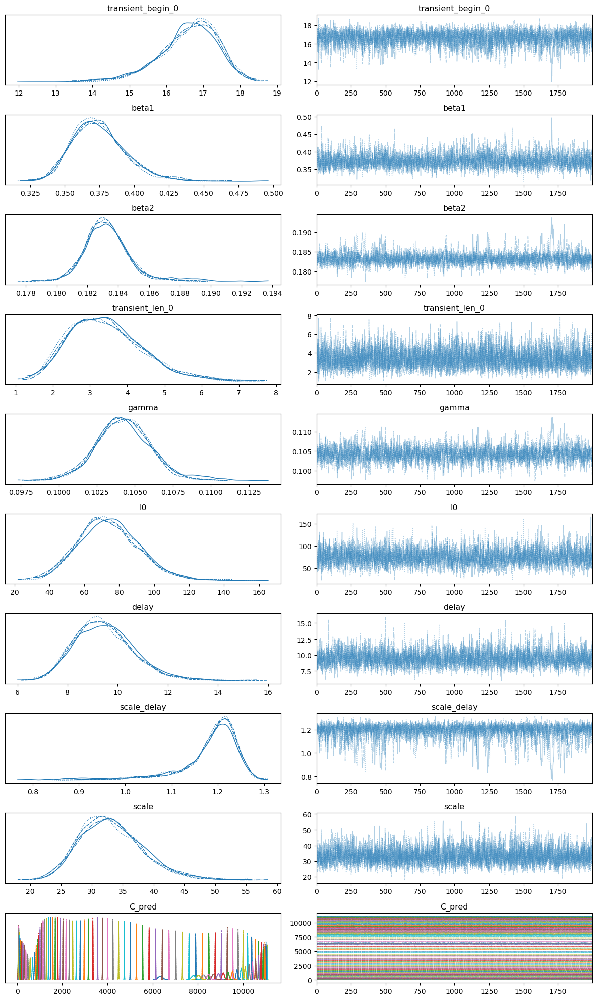

In [328]:
# SIR model with 1 switch and delay 
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model

# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta1": 0.2, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2]
num_days_sim = 100
tr_begin_list = [14] #[datetime(2020, 3, 9) + timedelta(days=50)]
tr_len_list = [3]
# SIR deterministico

# --------------------------------------------------------------------------------------------
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# ----------------------------------------------
# Rumore osservativo t-Student
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(C_obs))

date_begin_simulation = datetime(2020, 3, 9)
change_points_list = [14] # changing point at day 50 

change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=14),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    }
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)

    lambda_list = [beta1, beta2]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )
    C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

    num_days_data = C_pred.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=C_pred[:num_days_data],
                 sigma= scale, 
                 observed=C_obs)

    trace = pm.sample(2000, tune=500, cores=4, chains=4, target_accept=0.85)



az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [334]:
summary = az.summary(trace)
summary.head(10)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,16.625,0.776,15.180,18.030,0.019,0.014,1871.0,2036.0,1.0
beta1,0.375,0.019,0.341,0.412,0.000,0.000,1966.0,2262.0,1.0
beta2,0.183,0.001,0.181,0.186,0.000,0.000,1482.0,903.0,1.0
transient_len_0,3.422,0.986,1.730,5.301,0.017,0.012,3624.0,3855.0,1.0
gamma,0.104,0.002,0.101,0.108,0.000,0.000,1523.0,1157.0,1.0
I0,74.100,17.618,40.056,105.356,0.360,0.255,2322.0,2545.0,1.0
delay,9.449,1.175,7.309,11.562,0.024,0.017,2491.0,3035.0,1.0
scale_delay,1.185,0.066,1.053,1.275,0.002,0.002,1442.0,855.0,1.0
scale,33.160,5.082,23.885,42.486,0.093,0.066,3128.0,4506.0,1.0
C_pred[0],6338.858,101.092,6140.643,6518.783,1.916,1.356,2802.0,3464.0,1.0


# SIR model with 3 switches    

Three different switching points are now predicted in the model, in order to describe the spreading of a pandemic.

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change points     | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
|                   | \( $t_2$ \)  | Normal(2020/03/16, 1)         |
|                   | \( $t_3$ \)  | Normal(2020/03/23, 1)         |
| Change duration   | \( $\Delta t_i$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
|                   | \( $\beta_2$ \) | LogNormal(log(1/8), 0.5)  |
|                   | \( $\beta_3$ \) | LogNormal(log(1/16), 0.5) |
| Recovery rate     | \( $\gamma $\)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |


In [162]:
from SIR_functions import sir_discrete_multi_sw
# Parameters
N = 1e6 # population size 
t = np.linspace(0, 100, 100) # time grid 

beta_vals = [0.4, 0.2, 1/8, 1/16]
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_beta_3, mu_beta_3 = 0.5, np.log(1/8)
sigma_beta_4, mu_beta_4 = 0.5, np.log(1/16)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_I0 = 100
sigma_scale = 100 # 10 before 
sigma_time1, mu_time1 = 3, 50
sigma_time2, mu_time2 = 1, 57
sigma_time3, mu_time3 = 1, 64
sigma_dt, mu_dt = 0.3, np.log(3)

In [164]:
# Modello con le prior del paper 
def log_prior(beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch):
    logp = (    
        stats.lognorm.logpdf(beta1, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(beta2, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(beta3, s=sigma_beta_3, scale=np.exp(mu_beta_3)) +
        stats.lognorm.logpdf(beta4, s=sigma_beta_4, scale=np.exp(mu_beta_4)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale) +
        stats.norm.logpdf(t_switch1, loc = mu_time1, scale = sigma_time1) +
        stats.norm.logpdf(t_switch2, loc = mu_time2, scale = sigma_time2) +
        stats.norm.logpdf(t_switch3, loc = mu_time3, scale = sigma_time3) + 
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

In [166]:
# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    I_pred = sir_discrete_multi_sw(beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=I_pred, scale=scale))


In [168]:
# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    prior = log_prior(beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:283: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


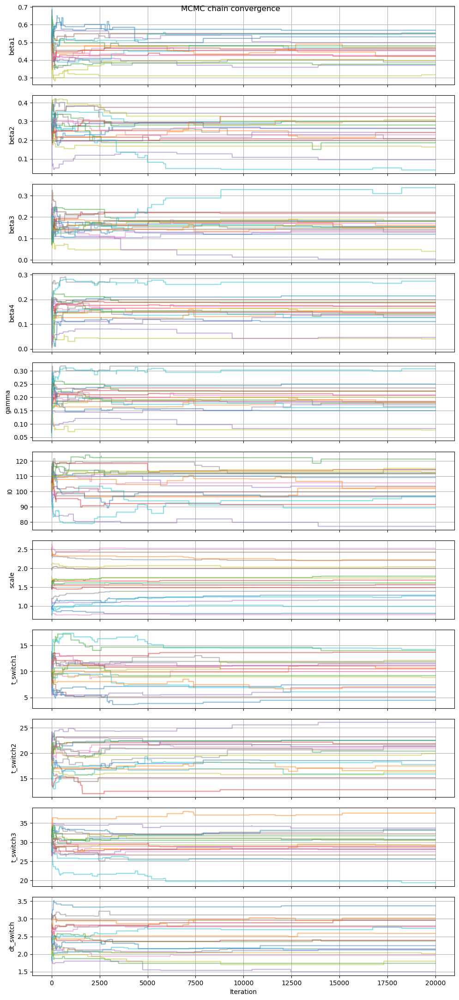

In [170]:
n_chains = 20
t_max = 100
true_params = [0.4, 0.2, 1/8, 1/16, 0.1, 100, 2, 7, 14, 21, 3]  # True values for beta_before, beta_after, gamma, I0, scale
I_true = sir_discrete_multi_sw(*true_params, t_max, N)  # Generate true epidemic curve
I_true += np.random.normal(0, true_params[6], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.5, 0.3, 0.2, 0.15, 0.09, 105, 1.5, 10, 20, 30, 2.5]  # beta1, beta2, beta3, beta4, gamma, I0, scale, t1, t2, t3, t4, dt

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 0.02, 0.02, 0.02, 2, 0.5, 2, 2, 2, 0.5], 11)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.02, 0.02, 0.02, 0.02, 0.02, 2, 0.02, 0.5, 0.5, 0.5, 0.05]) + np.random.uniform(-0.005, 0.005, 11)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, I_true, n_iter=20000, n_chains=n_chains)

# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta1", "beta2", "beta3", "beta4", "gamma", "I0", "scale", "t_switch1", "t_switch2", "t_switch3", "dt_switch"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

True Params:
  Beta1: 0.4000, Beta2: 0.2000, Beta3: 0.1250, Beta4: 0.0625, gamma: 0.1, I0: 100, scale: 2, t_switch1: 7,  t_switch2: 14,  t_switch3: 21, dt_switch: 3
Inferred Params:
  beta1: 0.4578 ± 0.0682
  beta2: 0.2434 ± 0.0799
  beta3: 0.1575 ± 0.0645
  beta4: 0.1582 ± 0.0584
  gamma: 0.1945 ± 0.0575
  I0: 104.2584 ± 10.4495
  scale: 1.6251 ± 0.4930
  t_switch1: 9.8665 ± 2.8280
  t_switch2: 19.6621 ± 3.1905
  t_switch3: 29.5138 ± 3.7078
  dt_switch: 2.4354 ± 0.5028


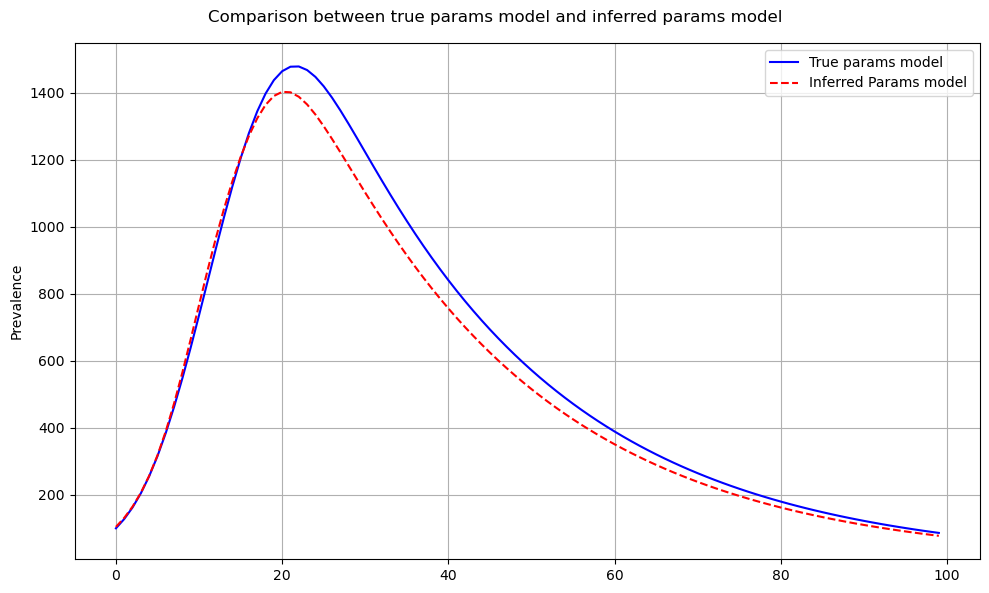

In [171]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, beta3_sampled, beta4_sampled, gamma_sampled, I0_sampled, scale_sampled, t_switch1_sampled, t_switch2_sampled, t_switch3_sampled, dt_switch_sampled = mean_estimates

print("True Params:")
print(f"  Beta1: {true_params[0]:.4f}, Beta2: {true_params[1]:.4f}, Beta3: {true_params[2]:.4f}, Beta4: {true_params[3]:.4f}, gamma: {true_params[4]}, I0: {true_params[5]}, scale: {true_params[6]}, t_switch1: {true_params[7]},  t_switch2: {true_params[8]},  t_switch3: {true_params[9]}, dt_switch: {true_params[10]}")

print("Inferred Params:")
for name, mean, std in zip(param_names, mean_estimates, std_estimates):
    print(f"  {name}: {mean:.4f} ± {std:.4f}")
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model = sir_discrete_multi_sw(*true_params, t_max, N)
I_sampled_model = sir_discrete_multi_sw(*mean_estimates, t_max, N)

# ---- PLOT CONFRONTO ----
fig = plt.figure(figsize=(10, 6))

# Plot Infected Cases
plt.plot(I_true_model, label="True params model", color="blue")
plt.plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between true params model and inferred params model")
plt.tight_layout()
plt.show()

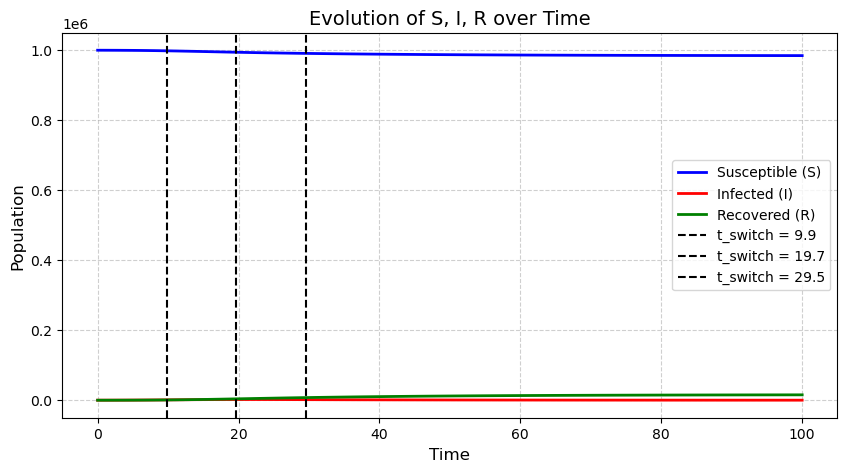

In [172]:
# Basic sir model, just for the plot 
def sir_model(y, t, beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch):
    S, I, R = y
        # Smooth transitions between beta values   
    transition1 = 1 / (1 + np.exp(-(t - t_switch1) / dt_switch))
    transition2 = 1 / (1 + np.exp(-(t - t_switch2) / dt_switch))
    transition3 = 1 / (1 + np.exp(-(t - t_switch3) / dt_switch))

        # Weighted combination of beta values
    beta = (beta1 * (1 - transition1) + 
            beta2 * (transition1 * (1 - transition2)) + 
            beta3 * (transition2 * (1 - transition3)) + 
            beta4 * transition3)
    
    dSdt = -beta * S * I / N
    dIdt = beta * S * I / N - gamma * I
    dRdt = gamma * I
    return [dSdt, dIdt, dRdt]


# ---- SOLVE SIR MODEL USING ESTIMATED PARAMETERS ----
S0_est = N - I0_sampled
y0_est = [S0_est, I0_sampled, 0]  # Initial conditions

sol_est = odeint(sir_model, y0_est, t, args=(beta1_sampled, beta2_sampled, beta3_sampled, beta4_sampled, 
                                             gamma_sampled, I0_sampled, scale_sampled, t_switch1_sampled, 
                                             t_switch2_sampled, t_switch3_sampled, dt_switch_sampled))

S_est, I_est, R_est = sol_est[:, 0], sol_est[:, 1], sol_est[:, 2]

# ---- PLOT THE EVOLUTION OF S, I, R ----

plt.figure(figsize=(10, 5))

# Traccia le curve per S, I, R
plt.plot(t, S_est, label="Susceptible (S)", color="blue", linewidth=2)
plt.plot(t, I_est, label="Infected (I)", color="red", linewidth=2)
plt.plot(t, R_est, label="Recovered (R)", color="green", linewidth=2)

# Linea verticale per t_switch
plt.axvline(x=t_switch1_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch1_sampled:.1f}")
plt.axvline(x=t_switch2_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch2_sampled:.1f}")
plt.axvline(x=t_switch3_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch3_sampled:.1f}")



# Miglioramenti estetici
plt.xlabel("Time", fontsize=12)
plt.ylabel("Population", fontsize=12)
plt.title("Evolution of S, I, R over Time", fontsize=14)
plt.legend(fontsize=10)
plt.grid(True, linestyle="--", alpha=0.6)

# Mostra il grafico
plt.show()

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, beta3, beta4, transient_begin_0, transient_begin_1, transient_begin_2, transient_len_0, transient_len_1, transient_len_2, gamma, I0, scale]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 370 seconds.


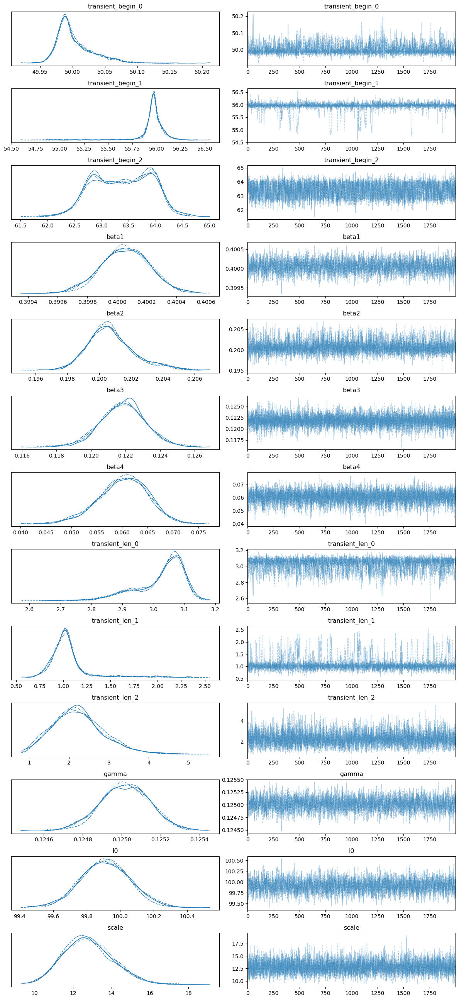

In [50]:
# SIR model with 3 switches and no delay 
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model


# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta2": 0.2, "beta3": 1/8, "beta4": 1/16, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2, 1/8, 1/16]
num_days_sim = 100
tr_begin_list = [50, 56, 64]
tr_len_list = [3, 1, 1]
# SIR deterministico

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
I_obs = I_new_true + stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(I_new_true))

date_begin_simulation = datetime(2020, 3, 9)
change_points_list = [50] # changing point at day 50 

# Lista contenente soltanto i change points 
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=50),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=56),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=64),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
    beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
    beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

    lambda_list = [beta1, beta2, beta3, beta4]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    #delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    #scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )

    num_days_data = new_I.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=new_I[:num_days_data],
                 sigma= scale, 
                 observed=I_obs)

    step = pm.NUTS(target_accept=0.95)
    trace = pm.sample(2000, tune=1000, cores=4, chains=4, step=step)


az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [51]:
summary = az.summary(trace)
print(summary.head(15))

                     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
transient_begin_0  50.003  0.030  49.961   50.064      0.001    0.001   
transient_begin_1  55.958  0.147  55.801   56.172      0.005    0.004   
transient_begin_2  63.389  0.524  62.519   64.245      0.010    0.007   
beta1               0.400  0.000   0.400    0.400      0.000    0.000   
beta2               0.201  0.001   0.198    0.204      0.000    0.000   
beta3               0.122  0.001   0.119    0.124      0.000    0.000   
beta4               0.060  0.005   0.051    0.069      0.000    0.000   
transient_len_0     3.025  0.078   2.867    3.135      0.002    0.001   
transient_len_1     1.054  0.227   0.670    1.450      0.007    0.005   
transient_len_2     2.231  0.644   1.042    3.371      0.010    0.007   
gamma               0.125  0.000   0.125    0.125      0.000    0.000   
I0                 99.914  0.146  99.649  100.198      0.003    0.002   
scale              12.782  1.280  10.461   15.197  

# SIR model with 3 switches and delay 

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change points     | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
|                   | \( $t_2$ \)  | Normal(2020/03/16, 1)         |
|                   | \( $t_3$ \)  | Normal(2020/03/23, 1)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
|                   | \( $\beta_2$ \) | LogNormal(log(1/8), 0.5)  |
|                   | \( $\beta_3$ \) | LogNormal(log(1/16), 0.5) |
| Recovery rate     | \( $\gamma $\)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |


Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:283: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


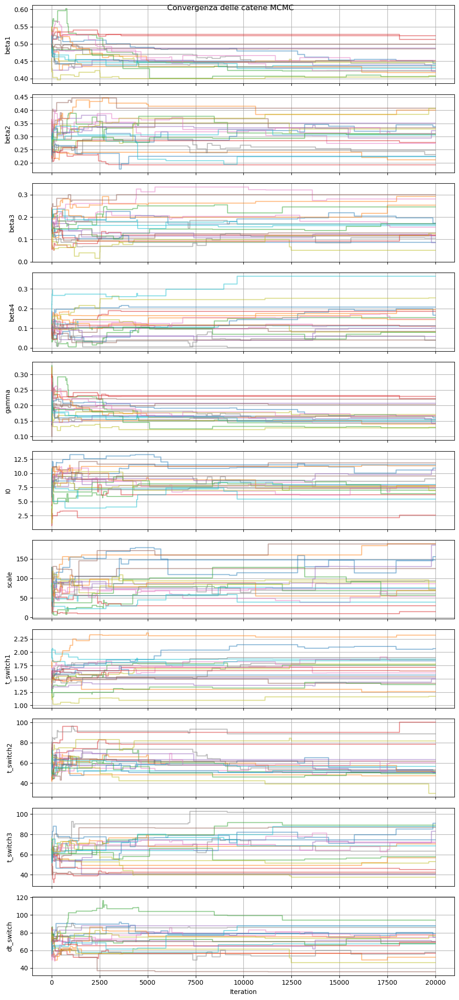

In [53]:
from SIR_functions import sir_discrete_delay_multi_sw

# ---- PARAMETERS ----
N = 1e6  # Population size
t_max = 100  # Total days of simulation
# Priors
N = 1e6
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_beta_3, mu_beta_3 = 0.5, np.log(1/8)
sigma_beta_4, mu_beta_4 = 0.5, np.log(1/16)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_delay, mu_delay = 0.2, np.log(8)
sigma_I0 = 100
sigma_scale = 10
sigma_time1, mu_time1 = 3, 10
sigma_time2, mu_time2 = 1, 20
sigma_time3, mu_time3 = 1, 30
sigma_dt, mu_dt = 0.3, np.log(3)

# ---- PRIOR FUNCTION ----
def log_prior(beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch):
    logp = (    
        stats.lognorm.logpdf(beta1, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(beta2, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(beta3, s=sigma_beta_3, scale=np.exp(mu_beta_3)) +
        stats.lognorm.logpdf(beta4, s=sigma_beta_4, scale=np.exp(mu_beta_4)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.lognorm.logpdf(delay, s=0.2, scale=np.exp(np.log(8))) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale) +
        stats.norm.logpdf(t_switch1, loc = mu_time1, scale = sigma_time1) +
        stats.norm.logpdf(t_switch2, loc = mu_time2, scale = sigma_time2) +
        stats.norm.logpdf(t_switch3, loc = mu_time3, scale = sigma_time3) + 
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    I_pred, C_pred = sir_discrete_delay_multi_sw(beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch, t_max, N)  # Solve SIR model with delay


    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=C_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    prior = log_prior(beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch) 
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)



n_chains = 20  # Numero di catene
true_params = np.array([0.4, 0.2, 1/8, 1/16, 1/8, 8, 100, 2, 10, 20, 30, 3])

params = np.array([0.5, 0.3, 0.17, 0.12, 0.15, 6, 80, 1.5, 60, 65, 70, 2.5])

I_true, C_true = sir_discrete_delay_multi_sw(*true_params, t_max, N)  # Generate true epidemic curve
C_true += np.random.normal(0, true_params[7], size=t_max)  # Add noise

# Nuovi intervalli di generazione basati sulle migliori stime
initial_params_list = [
    params + np.random.normal(0, [0.02, 0.02, 0.01, 0.01, 0.01, 2, 2, 0.2, 0.5, 0.5, 0.5, 0.05], 12)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 0.02, 0.02, 0.05, 1, 20, 0.05, 5, 5, 5, 0.1]) + np.random.uniform(-0.005, 0.005, 12)
    for _ in range(n_chains)
]

samples_all_chains = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, C_true, n_iter=20000, n_chains=n_chains)

fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples_all_chains:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("Convergenza delle catene MCMC")
plt.tight_layout()
plt.show()

True Params:
  Beta1: 0.4000, Beta2: 0.2000, Beta3: 0.1250, Beta4: 0.0625, Gamma: 0.1250, delay: 8.0000, I0: 100.0, Scale: 2.0, t_switch1: 50.0,  t_switch2: 57.0,  t_switch3: 64.0, dt_switch: 3.0
Inferred Params:
  beta1: 0.4504 ± 0.0335
  beta2: 0.2990 ± 0.0618
  beta3: 0.1678 ± 0.0702
  beta4: 0.1330 ± 0.0818
  gamma: 0.1684 ± 0.0305
  delay: 8.1126 ± 2.1833
  I0: 91.8174 ± 48.2768
  scale: 1.6747 ± 0.2696
  t_switch1: 59.4809 ± 15.4542
  t_switch2: 66.0381 ± 18.4384
  t_switch3: 70.5701 ± 14.5491
  dt_switch: 2.5612 ± 0.4669


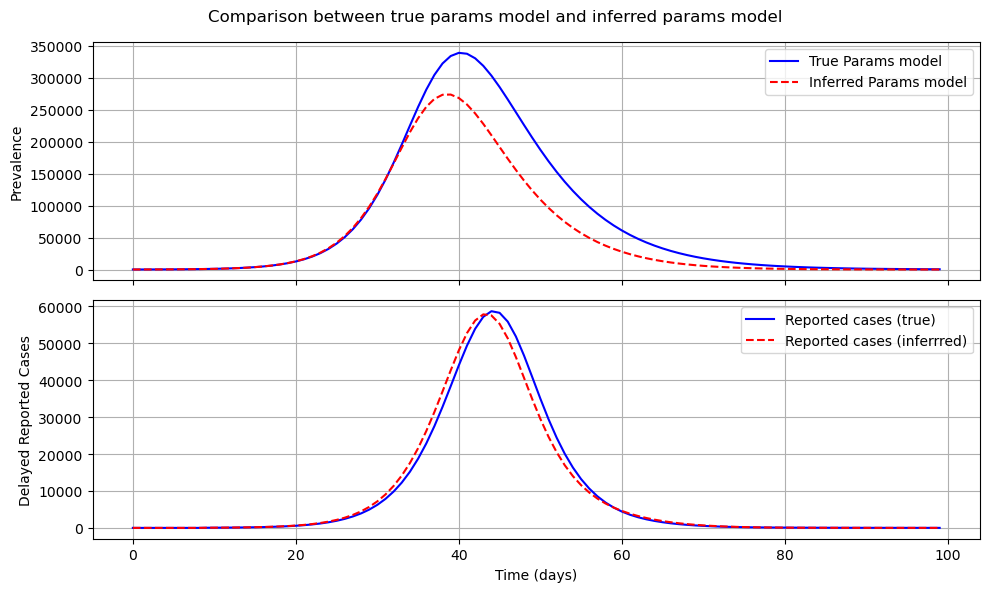

In [54]:
param_names = ["beta1", "beta2", "beta3", "beta4", "gamma", "delay", "I0", "scale", "t_switch1", "t_switch2", "t_switch3", "dt_switch"]

burn_in = 1000
mean_estimates = np.mean(samples_all_chains[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples_all_chains[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, beta3_sampled, beta4_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_switch1_sampled, t_switch2_sampled, t_switch3_sampled, dt_switch_sampled = mean_estimates

print("True Params:")
print(f"  Beta1: {true_params[0]:.4f}, Beta2: {true_params[1]:.4f}, Beta3: {true_params[2]:.4f}, Beta4: {true_params[3]:.4f}, Gamma: {true_params[4]:.4f}, delay: {true_params[5]:.4f}, I0: {true_params[6]}, Scale: {true_params[7]}, t_switch1: {true_params[8]},  t_switch2: {true_params[9]},  t_switch3: {true_params[10]}, dt_switch: {true_params[11]}")

print("Inferred Params:")
for name, mean, std in zip(param_names, mean_estimates, std_estimates):
    print(f"  {name}: {mean:.4f} ± {std:.4f}")
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model, C_true_model = sir_discrete_delay_multi_sw(*true_params, t_max, N)
I_sampled_model, C_sampled_model = sir_discrete_delay_multi_sw(*mean_estimates, t_max, N)

fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

# Plot Infected Cases
ax[0].plot(I_true_model, label="True Params model", color="blue")
ax[0].plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
ax[0].set_ylabel("Prevalence")
ax[0].legend()
ax[0].grid()

# Plot Reported Cases (con delay)
ax[1].plot(C_true_model, label="Reported cases (true)", color="blue")
ax[1].plot(C_sampled_model, label="Reported cases (inferrred)", color="red", linestyle="dashed")
ax[1].set_ylabel("Delayed Reported Cases")
ax[1].set_xlabel("Time (days)")
ax[1].legend()
ax[1].grid()

fig.suptitle("Comparison between true params model and inferred params model")
plt.tight_layout()
plt.show()


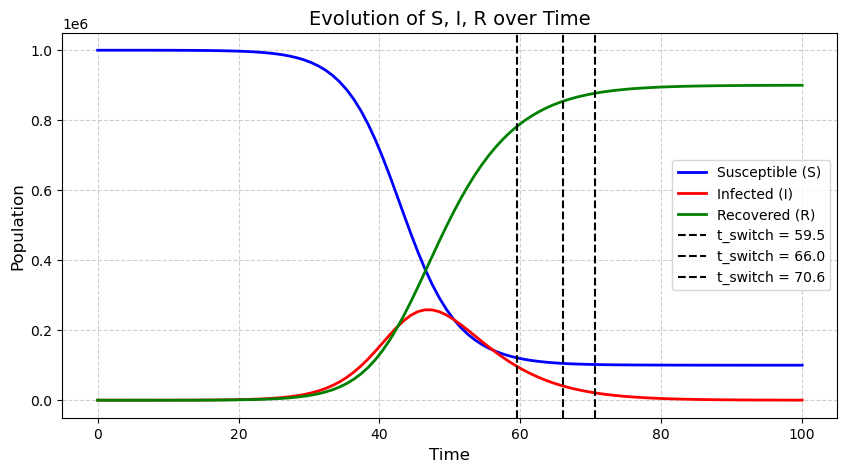

In [55]:
# Basic sir model, just for the plot 
def sir_model(y, t, beta1, beta2, beta3, beta4, gamma, delay, t_switch1, t_switch2, t_switch3, dt_switch, N, I_sampled_model):
    S, I, R = y
        # Smooth transitions between beta values   
    transition1 = 1 / (1 + np.exp(-(t - t_switch1) / dt_switch))
    transition2 = 1 / (1 + np.exp(-(t - t_switch2) / dt_switch))
    transition3 = 1 / (1 + np.exp(-(t - t_switch3) / dt_switch))

        # Weighted combination of beta values
    beta = (beta1 * (1 - transition1) + 
            beta2 * (transition1 * (1 - transition2)) + 
            beta3 * (transition2 * (1 - transition3)) + 
            beta4 * transition3)
    
    if int(t - delay) >= 0:  # Assicurati che t - delay sia un indice valido
        I_past = I_sampled_model[int(t - delay)]  # Infezioni avvenute 'delay' giorni fa
    else:
        I_past = 0  # Se t - delay è negativo, considera che non ci sono infezioni passate
    
    # Calcolare le derivate
    dSdt = -beta * S * I_past / N  # Nuove infezioni dipendono dalle infezioni ritardate
    dIdt = beta * S * I_past / N - gamma * I  # Infezioni e recupero
    dRdt = gamma * I  # Recuperi
    
    return [dSdt, dIdt, dRdt]  # Non è più necessario restituire I_past_array

# ---- SOLVE SIR MODEL USING ESTIMATED PARAMETERS ----
S0_est = N - I0_sampled
y0_est = [S0_est, I0_sampled, 0]  # Initial conditions

sol_est = odeint(sir_model, y0_est, t, args=(beta1_sampled, beta2_sampled, beta3_sampled, beta4_sampled, 
                                             gamma_sampled, delay_sampled, t_switch1_sampled, 
                                             t_switch2_sampled, t_switch3_sampled, dt_switch_sampled, N, I_sampled_model))

S_est, I_est, R_est = sol_est[:, 0], sol_est[:, 1], sol_est[:, 2]

# ---- PLOT THE EVOLUTION OF S, I, R ----

plt.figure(figsize=(10, 5))

# Traccia le curve per S, I, R
plt.plot(t, S_est, label="Susceptible (S)", color="blue", linewidth=2)
plt.plot(t, I_est, label="Infected (I)", color="red", linewidth=2)
plt.plot(t, R_est, label="Recovered (R)", color="green", linewidth=2)

# Linea verticale per t_switch
plt.axvline(x=t_switch1_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch1_sampled:.1f}")
plt.axvline(x=t_switch2_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch2_sampled:.1f}")
plt.axvline(x=t_switch3_sampled, color="black", linestyle="dashed", linewidth=1.5, label=f"t_switch = {t_switch3_sampled:.1f}")



# Miglioramenti estetici
plt.xlabel("Time", fontsize=12)
plt.ylabel("Population", fontsize=12)
plt.title("Evolution of S, I, R over Time", fontsize=14)
plt.legend(fontsize=10)
plt.grid(True, linestyle="--", alpha=0.6)

# Mostra il grafico
plt.show()

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, beta3, beta4, transient_begin_0, transient_begin_1, transient_begin_2, transient_len_0, transient_len_1, transient_len_2, gamma, I0, delay, scale_delay, scale]


Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 1209 seconds.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


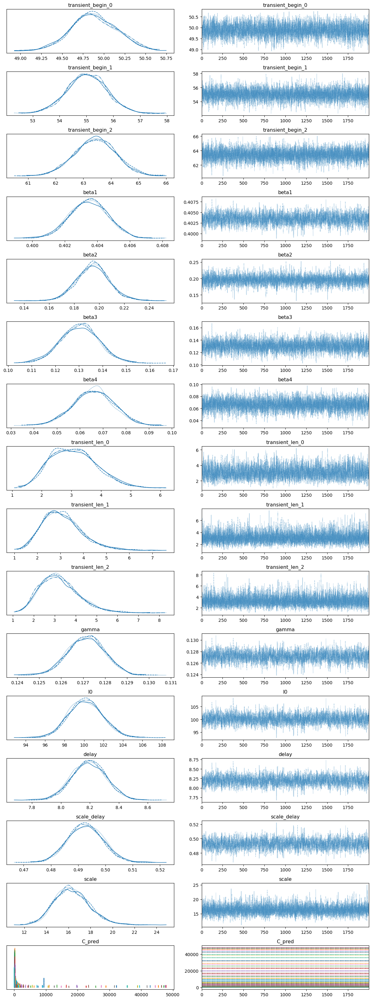

In [56]:
# SIR model with 3 switches and delay 
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model



# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta2": 0.2, "beta3": 1/8, "beta4": 1/16, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2, 1/8, 1/16]
num_days_sim = 100
tr_begin_list = [50, 56, 64]
tr_len_list = [3, 1, 1]
# SIR deterministico

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(C_obs))

date_begin_simulation = datetime(2020, 3, 9)
change_points_list = [50] # changing point at day 50 

# Lista contenente soltanto i change points 
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=50),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=56),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=64),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
    beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
    beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

    lambda_list = [beta1, beta2, beta3, beta4]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )
    C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

    num_days_data = C_pred.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=C_pred[:num_days_data],
                 sigma= scale, 
                 observed=C_obs)

    trace = pm.sample(2000, tune=500, cores=4, chains=4, target_accept=0.85)



az.plot_trace(trace)
plt.tight_layout()
plt.show()


In [57]:
summary = az.summary(trace)
summary.head(15)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,49.883,0.279,49.387,50.436,0.004,0.003,4285.0,5061.0,1.0
transient_begin_1,55.011,0.748,53.613,56.452,0.010,0.007,5705.0,4867.0,1.0
transient_begin_2,63.425,0.743,62.049,64.839,0.010,0.007,5960.0,5423.0,1.0
beta1,0.403,0.001,0.401,0.406,0.000,0.000,2273.0,3216.0,1.0
beta2,0.195,0.013,0.170,0.220,0.000,0.000,4232.0,4359.0,1.0
beta3,0.130,0.008,0.115,0.146,0.000,0.000,3529.0,4604.0,1.0
beta4,0.066,0.009,0.049,0.082,0.000,0.000,4151.0,4589.0,1.0
transient_len_0,3.079,0.773,1.746,4.535,0.013,0.010,3560.0,4530.0,1.0
transient_len_1,3.088,0.869,1.559,4.716,0.010,0.007,7835.0,5512.0,1.0
transient_len_2,3.240,0.927,1.706,5.018,0.011,0.008,7497.0,5823.0,1.0


---
# WEEKLY MODULATION

In [ ]:
import pymc as pm
import pytensor
import pytensor.tensor as pt
import numpy as np
from datetime import datetime, timedelta 
import arviz as az
import matplotlib.pyplot as plt
from SIR_functions import _SIR_model, smooth_step_function, delay_cases_lognormal, make_delay_matrix

def SIR_with_change_points(
    new_cases_obs,
    change_points_list,
    date_begin_simulation,
    num_days_sim,
    diff_data_sim,
    N,
    weekends_modulated=True,
    weekend_modulation_type='step'):

    with pm.Model() as model:
        beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
        beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
        beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
        beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

        lambda_list = [beta1, beta2, beta3, beta4]
 
        # list of start dates of the transient periods of the change points
        tr_begin_list = []
        dt_before = date_begin_simulation
        for i, cp in enumerate(change_points_list):
            dt_begin_transient = cp["pr_mean_date_begin_transient"]
            if dt_before is not None and dt_before > dt_begin_transient:
                raise RuntimeError("Dates of change points are not temporally ordered")
            prior_mean = (
                dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
            tr_begin = pm.Normal(
                name=f"transient_begin_{i}",
                mu=prior_mean,
                sigma=cp["pr_sigma_date_begin_transient"],
            )
            tr_begin_list.append(tr_begin)
            dt_before = dt_begin_transient
        # same for transient times
        tr_len_list = []

        for i, cp in enumerate(change_points_list):
            tr_len = pm.Lognormal(
                name=f"transient_len_{i}",
                mu=np.log(cp["pr_median_transient_len"]),
                sigma=cp["pr_sigma_transient_len"],
            )
            tr_len_list.append(tr_len)
        # build the time-dependent spreading rate
        lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
        lambda_before = lambda_list[0]

        for tr_begin, tr_len, lambda_after in zip(
            tr_begin_list, tr_len_list, lambda_list[1:]
        ):
            lambda_t = smooth_step_function(
                start_val=0,
                end_val=1,
                t_begin=tr_begin,
                t_end=tr_begin + tr_len,
                t_total=num_days_sim,
            ) * (lambda_after - lambda_before)
            lambda_before = lambda_after
            lambda_t_list.append(lambda_t)
        lambda_t = sum(lambda_t_list)

        gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
        I0 = pm.HalfCauchy("I0", beta=100)
        delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
        scale_delay = pm.HalfNormal("scale_delay", sigma=1)
        scale = pm.HalfCauchy("scale", beta=10)

        S_begin = N - I0
        S, I, new_I = _SIR_model(lambda_t, gamma, S_begin, I0, N)

        # Delay per i dati osservati (approssimazione gaussiana)
        C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

        # MODULAZIONE WEEKEND
        if weekends_modulated:
            week_end_factor = pm.Beta('weekend_factor', mu=0.7,
                                                        sigma=0.17)
            if weekend_modulation_type == 'step':
                modulation = np.zeros(num_days_sim)
                for i in range(num_days_sim):
                    if i <= diff_data_sim:
                        modulation[i] = 1
                    else:
                        date_curr = date_begin_simulation  + timedelta(days=i + diff_data_sim + 1)
                        if date_curr.isoweekday() in [6, 7]: # default weekend days are Saturday and Sunday (6 and 7)
                            modulation[i] = 1
            elif weekend_modulation_type == 'abs_sine':
                offset_rad = pm.VonMises('offset_modulation_rad', mu = 0, kappa = 0.01)
                offset = pm.Deterministic('offset_modulation', offset_rad/(2*np.pi)*7)
                t = np.array([0 if i <= diff_data_sim or (i + diff_data_sim + 1) % 7 == 0 else i - diff_data_sim for i in range(t_max)])
                modulation = 1-pt.abs(pt.sin(t/7 * np.pi + offset_rad/2))

            multiplication_vec = np.ones(num_days_sim) - (1 - week_end_factor) * modulation
            new_cases_inferred_eff  = C_pred * multiplication_vec
        else:
            new_cases_inferred_eff = C_pred

        # Likelihood
        pm.StudentT("_new_cases_studentT", nu=4,
                    mu=new_cases_inferred_eff[:len(new_cases_obs)],
                    sigma= scale,
                    observed=new_cases_obs)

        # Deterministiche per le posterior
        #pm.Deterministic("lambda_t", lambda_t)
        #pm.Deterministic("new_cases_inferred", new_cases_inferred_eff)

    return model

# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta2": 0.2, "beta3": 1/8, "beta4": 1/16, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 83e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2, 1/8, 1/16]
num_days_sim = 100
tr_begin_list = [50, 56, 64]
tr_len_list = [3, 1, 1]

# Impostazioni modello
date_begin_simulation = datetime(2020, 3, 2)
num_days_sim = 100
diff_data_sim = 10 # giorno dopo il quale osservo il primo valore in caso di presenza di delay nel modello, 
                   # ossia se la simulazione ha un delay di 8 giorni vedrò il primo caso al giorno 8

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

# Data simulation with true values 
S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Introduction of the weekend modulation inside the model 
f_w = 0.7  # Ampiezza della modulazione settimanale
Phi_w = 0   # Fase della modulazione settimanale

date_begin = date_begin_simulation + timedelta(days=diff_data_sim + 1)


t = np.array([0 if i <= diff_data_sim or (i + diff_data_sim + 1) % 7 == 0 else i - diff_data_sim for i in range(t_max)])


modulation = 1 - np.abs(np.sin(t / 7 * np.pi + Phi_w / 2))

multiplication_vec = np.ones(num_days_sim) - (1 - f_w) * modulation # è un fattore riduttivo per l'array C_obs, che va da 1 a sotto 1 

# Applicazione della modulazione ai dati osservati
C_obs *= multiplication_vec

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(C_obs))


# Definizione change points
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=50),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=56),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=64),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]



# Esegui inferenza bayesiana
model = SIR_with_change_points(
    C_obs,
    change_points_list,
    date_begin_simulation,
    num_days_sim,
    diff_data_sim,
    N,
    weekends_modulated=True,
    weekend_modulation_type='step'
)

with model:
    trace = pm.sample(2000, tune=1000, target_accept=0.9, cores=2)

az.plot_trace(trace, var_names=['lambda_0', 'lambda_1', 'lambda_2', 'mu', 'delay', 'sigma_obs', 'weekend_factor'])
plt.tight_layout()
plt.show()

az.plot_posterior(trace, var_names=['lambda_0', 'lambda_1', 'lambda_2', 'mu', 'delay', 'sigma_obs', 'weekend_factor'])
plt.tight_layout()
plt.show()


Initializing NUTS using jitter+adapt_diag...
